In [1]:
import os
import shutil

# --- Configuration for Kaggle Notebook ---

# Path to the input dataset (this is where Kaggle mounts your data)
base_dir = '/kaggle/input/improvedthiefdetectiondataset'

# Path to the output directory (this is the writable directory in Kaggle)
output_dir = '/kaggle/working/sorted_data'

# The sets to process within the dataset
dataset_splits = ['train', 'valid', 'test']

# Define class IDs (!! IMPORTANT: VERIFY THIS in your data.yaml file !!)
# We are assuming: 0 = human, 1 = suspicion
HUMAN_CLASS_ID = 0
SUSPICION_CLASS_ID = 1


# --- Script Logic ---

def sort_dataset_splits():
    """
    Loops through train, valid, and test sets, reads YOLO annotations,
    and sorts images into 'suspicious' and 'human_only' for each set.
    """
    print("Starting image sorting process for all dataset splits...")

    # Loop over each split (train, valid, test)
    for split in dataset_splits:
        print(f"\n--- Processing '{split}' set ---")

        # Define paths for the current split
        split_dir = os.path.join(base_dir, split)
        image_dir = os.path.join(split_dir, 'images')
        label_dir = os.path.join(split_dir, 'labels')

        # Check if the directories for the split exist
        if not os.path.isdir(image_dir) or not os.path.isdir(label_dir):
            print(f"Warning: '{split}' directory not found or incomplete. Skipping.")
            continue

        # Define the output directories for the current split
        output_split_dir = os.path.join(output_dir, split)
        suspicious_folder = os.path.join(output_split_dir, 'suspicious_images')
        human_only_folder = os.path.join(output_split_dir, 'human_only_images')

        # Create the output directories
        os.makedirs(suspicious_folder, exist_ok=True)
        os.makedirs(human_only_folder, exist_ok=True)

        # Get a list of all annotation files
        annotation_files = os.listdir(label_dir)

        for label_file in annotation_files:
            if not label_file.endswith('.txt'):
                continue

            contains_suspicion = False
            contains_human = False

            with open(os.path.join(label_dir, label_file), 'r') as f:
                for line in f:
                    try:
                        class_id = int(line.split()[0])
                        if class_id == SUSPICION_CLASS_ID:
                            contains_suspicion = True
                        elif class_id == HUMAN_CLASS_ID:
                            contains_human = True
                    except (IndexError, ValueError):
                        continue

            image_name = os.path.splitext(label_file)[0] + '.jpg'
            source_image_path = os.path.join(image_dir, image_name)

            if not os.path.exists(source_image_path):
                print(f"Warning: No corresponding image found for {label_file} in {split} set.")
                continue

            if contains_suspicion:
                shutil.copy(source_image_path, os.path.join(suspicious_folder, image_name))
            elif contains_human:
                shutil.copy(source_image_path, os.path.join(human_only_folder, image_name))

        print(f"Finished processing '{split}' set.")
        print(f"Found {len(os.listdir(suspicious_folder))} suspicious images.")
        print(f"Found {len(os.listdir(human_only_folder))} human-only images.")

    print(f"\n\n✅ All sets processed successfully! Your sorted data is in '{output_dir}'.")

# Run the function
sort_dataset_splits()

Starting image sorting process for all dataset splits...

--- Processing 'train' set ---
Finished processing 'train' set.
Found 6103 suspicious images.
Found 4317 human-only images.

--- Processing 'valid' set ---
Finished processing 'valid' set.
Found 701 suspicious images.
Found 624 human-only images.

--- Processing 'test' set ---
Finished processing 'test' set.
Found 337 suspicious images.
Found 398 human-only images.


✅ All sets processed successfully! Your sorted data is in '/kaggle/working/sorted_data'.


In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt



2025-08-08 00:01:09.020730: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754611269.196356      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754611269.251629      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# --- 1. Define Paths and Parameters ---

# The base directory for our sorted data
train_dir = '/kaggle/working/sorted_data/train'
validation_dir = '/kaggle/working/sorted_data/valid'

# Model parameters
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32
EPOCHS = 20 # You can increase this for better performance if not overfitting



In [4]:
# --- 2. Load and Augment Data ---

# Use ImageDataGenerator to load images from directories and apply data augmentation
# Data augmentation helps prevent overfitting by creating modified versions of your images
train_image_generator = ImageDataGenerator(
    rescale=1./255,            # Rescale pixel values from [0, 255] to [0, 1]
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_image_generator = ImageDataGenerator(rescale=1./255) # Only rescale validation data

# Create data loaders
train_data_gen = train_image_generator.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=train_dir,
    shuffle=True,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    class_mode='binary' # Since we have two classes: 'human_only_images' and 'suspicious_images'
)

val_data_gen = validation_image_generator.flow_from_directory(
    batch_size=BATCH_SIZE,
    directory=validation_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    class_mode='binary'
)



Found 10420 images belonging to 2 classes.
Found 1325 images belonging to 2 classes.


In [5]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, BatchNormalization,
    Flatten, Dense, Dropout, Activation
)

# --- Define Image Dimensions ---
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 3

# --- Input ---
inputs = Input(shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# --- Block 1 ---
x = Conv2D(32, (3, 3), padding='same')(inputs)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# --- Block 2 ---
x = Conv2D(64, (3, 3), padding='same')(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# --- Block 3 ---
x = Conv2D(128, (3, 3), padding='same')(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), padding='same')(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# --- Block 4 ---
x = Conv2D(256, (3, 3), padding='same', name='last_conv')(x)  # Named for Grad-CAM
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Conv2D(256, (3, 3), padding='same')(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# --- Fully Connected Layers ---
x = Flatten()(x)
x = Dense(1024)(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(512)(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

# --- Output Layer ---
outputs = Dense(1, activation='sigmoid')(x)

# --- Define the Model ---
model = Model(inputs=inputs, outputs=outputs)

# --- Compile the Model ---
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# --- Model Summary ---
model.summary()


I0000 00:00:1754611283.387447      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1754611283.388205      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ last_conv (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │             

 Total params: 18,439,233 (70.34 MB)

 Trainable params: 18,434,433 (70.32 MB)

 Non-trainable params: 4,800 (18.75 KB)

In [6]:
# --- 4. Compile the Model ---

model.compile(optimizer='adam',
              loss='binary_crossentropy', # Appropriate loss function for binary classification
              metrics=['accuracy'])



In [7]:
# --- 5. Train the Model ---

history = model.fit(
    train_data_gen,
    steps_per_epoch=train_data_gen.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=val_data_gen,
    validation_steps=val_data_gen.samples // BATCH_SIZE
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


I0000 00:00:1754611292.872894      75 service.cc:148] XLA service 0x7cdb5c008950 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754611292.873946      75 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1754611292.873967      75 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1754611293.675229      75 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/325 ━━━━━━━━━━━━━━━━━━━━ 1:23:31 15s/step - accuracy: 0.4688 - loss: 1.1861

I0000 00:00:1754611300.636637      75 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


325/325 ━━━━━━━━━━━━━━━━━━━━ 85s 216ms/step - accuracy: 0.7172 - loss: 0.7152 - val_accuracy: 0.5831 - val_loss: 0.6583
Epoch 2/20
  1/325 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - accuracy: 0.8750 - loss: 0.3099

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


325/325 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.8750 - loss: 0.3099 - val_accuracy: 0.5785 - val_loss: 0.6279
Epoch 3/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 63s 194ms/step - accuracy: 0.8176 - loss: 0.4188 - val_accuracy: 0.8933 - val_loss: 0.3005
Epoch 4/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9062 - loss: 0.2211 - val_accuracy: 0.8727 - val_loss: 0.4236
Epoch 5/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 62s 190ms/step - accuracy: 0.8438 - loss: 0.3578 - val_accuracy: 0.8430 - val_loss: 0.6952
Epoch 6/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.8125 - loss: 0.3838 - val_accuracy: 0.8155 - val_loss: 0.8172
Epoch 7/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 63s 194ms/step - accuracy: 0.8586 - loss: 0.3201 - val_accuracy: 0.9238 - val_loss: 0.2178
Epoch 8/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.8125 - loss: 0.3544 - val_accuracy: 0.9276 - val_loss: 0.2114
Epoch 9/20
325/325 ━━━━━━━━━━━━━━━━━━━━ 62s 190ms/step - accuracy: 0.8666 - loss: 0.2977 - val_accuracy: 0

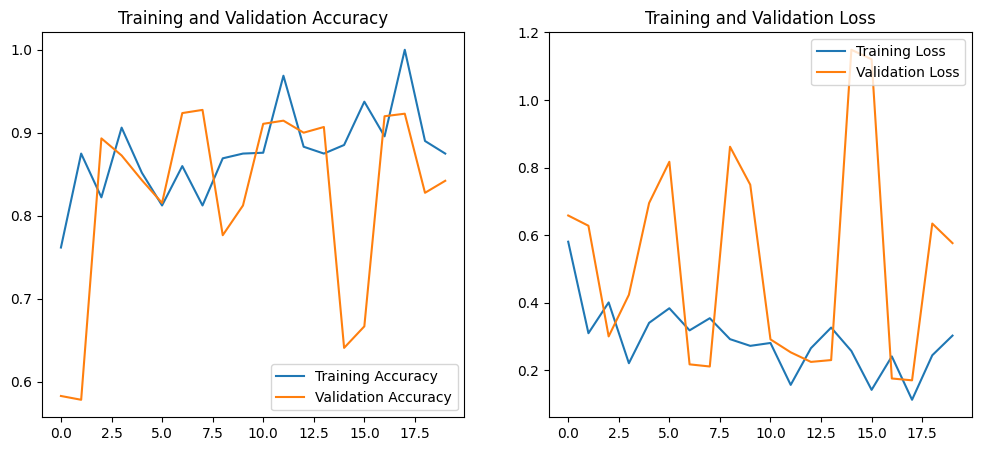

In [8]:
# --- 6. Visualize Training Results ---

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()



In [9]:
# --- 7. Save the Model (Optional) ---
# You can save your trained model to the /kaggle/working/ directory
model.save('/kaggle/working/suspicion_detection_model.h5')
print("Model saved successfully!")

Model saved successfully!


Loading trained model...
Found 735 images belonging to 2 classes.

Making predictions on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}

--- Classification Report ---
                   precision    recall  f1-score   support

human_only_images       0.81      1.00      0.89       398
suspicious_images       1.00      0.72      0.83       337

         accuracy                           0.87       735
        macro avg       0.90      0.86      0.86       735
     weighted avg       0.89      0.87      0.87       735


--- Confusion Matrix ---


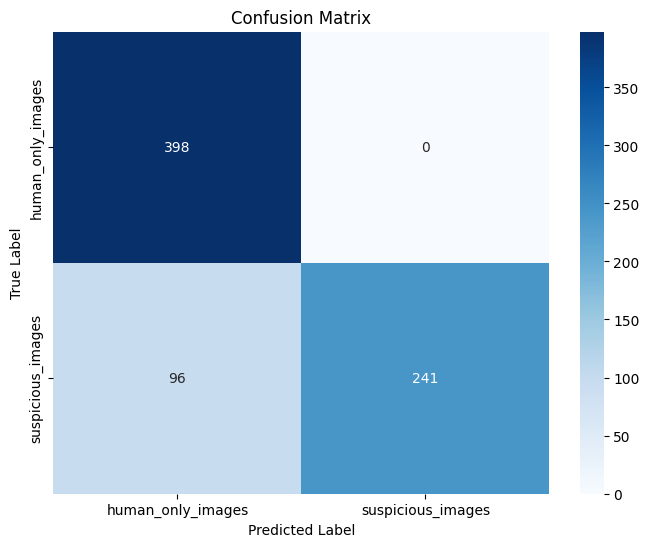

In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# --- 1. Load the Saved Model and Prepare Test Data ---

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32 # Use the same batch size as training

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create an ImageDataGenerator for the test set (only rescaling, no augmentation)
test_image_generator = ImageDataGenerator(rescale=1./255)

# Create the data generator for the test data
# IMPORTANT: Set shuffle=False to keep predictions in the same order as labels
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False  # Crucial for matching predictions to true labels
)

# --- 2. Make Predictions on the Test Set ---

print("\nMaking predictions on the test set...")

# Calculate the number of steps, ensuring it's an integer
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))

# The model.predict() function returns the raw probabilities (e.g., 0.98, 0.05)
predictions = model.predict(test_data_gen, steps=steps_for_prediction)

# Convert probabilities to binary class labels (0 or 1)
# We use a threshold of 0.5. If prediction > 0.5, it's class 1, otherwise class 0.
predicted_classes = (predictions > 0.5).astype(int)

# --- 3. Get True Labels and Class Names ---

# Get the true labels from the generator
true_classes = test_data_gen.classes

# Get the mapping of class names to their index (e.g., {'human_only_images': 0, 'suspicious_images': 1})
class_labels = list(test_data_gen.class_indices.keys())
print(f"Class Indices: {test_data_gen.class_indices}")


# --- 4. Display Evaluation Metrics ---

print("\n--- Classification Report ---")
# This report shows precision, recall, and F1-score for each class
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


print("\n--- Confusion Matrix ---")
# A confusion matrix shows how many predictions for each class were correct or incorrect
cm = confusion_matrix(true_classes, predicted_classes)

# Plot the confusion matrix using seaborn for a nice visualization
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

Loading trained model...
Found 735 images belonging to 2 classes.

Making predictions on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}

--- Classification Report ---
                   precision    recall  f1-score   support

human_only_images       0.81      1.00      0.89       398
suspicious_images       1.00      0.72      0.83       337

         accuracy                           0.87       735
        macro avg       0.90      0.86      0.86       735
     weighted avg       0.89      0.87      0.87       735


--- Confusion Matrix ---


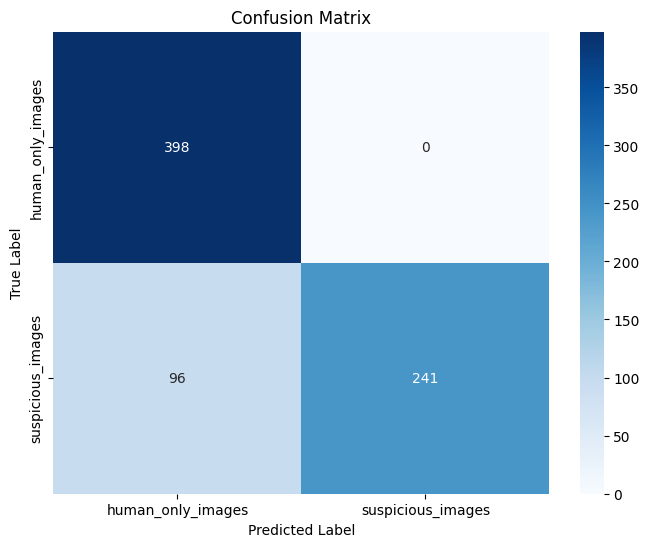


--- Correct Predictions and Misclassifications ---

Correct Predictions:
Total correct predictions: 639


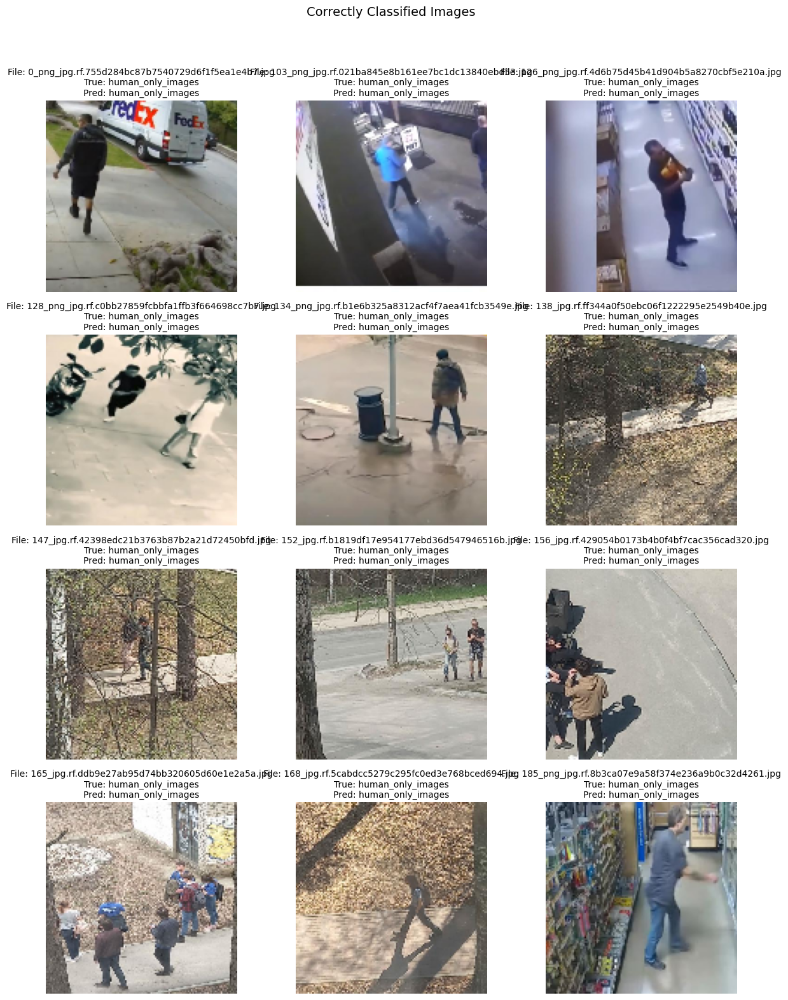


Misclassifications:
Total misclassifications: 96


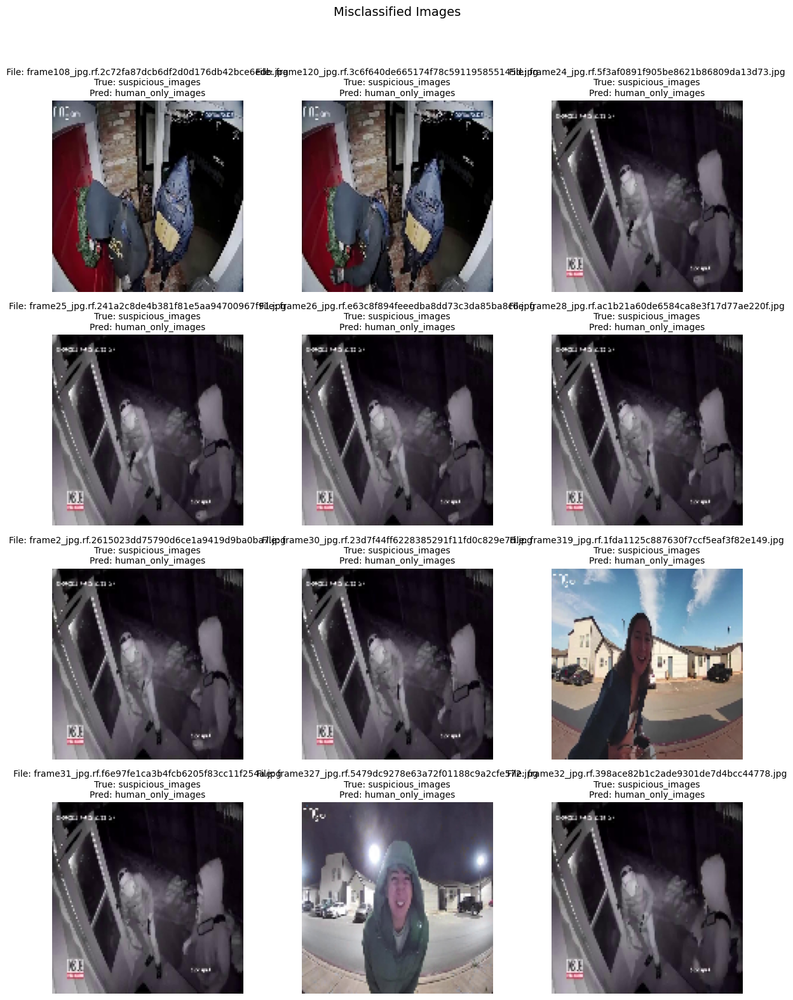

In [11]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os

# --- 1. Load the Saved Model and Prepare Test Data ---

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create an ImageDataGenerator for the test set (only rescaling, no augmentation)
test_image_generator = ImageDataGenerator(rescale=1./255)

# Create the data generator for the test data
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# --- 2. Make Predictions on the Test Set ---

print("\nMaking predictions on the test set...")
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions = model.predict(test_data_gen, steps=steps_for_prediction)
predicted_classes = (predictions > 0.5).astype(int)

# --- 3. Get True Labels and Class Names ---

true_classes = test_data_gen.classes
class_labels = list(test_data_gen.class_indices.keys())
print(f"Class Indices: {test_data_gen.class_indices}")

# --- 4. Display Evaluation Metrics ---

print("\n--- Classification Report ---")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

print("\n--- Confusion Matrix ---")
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# --- 5. Analyze and Visualize Correct Predictions and Misclassifications ---

print("\n--- Correct Predictions and Misclassifications ---")

# Get filenames
filenames = test_data_gen.filenames
correct_predictions = []
incorrect_predictions = []

# Iterate through predictions and true labels
for i in range(len(filenames)):
    file_path = os.path.join(test_dir, filenames[i])
    true_label = true_classes[i]
    predicted_label = predicted_classes[i][0] if predicted_classes.ndim > 1 else predicted_classes[i]
    true_class_name = class_labels[true_label]
    predicted_class_name = class_labels[predicted_label]
    
    if true_label == predicted_label:
        correct_predictions.append((file_path, true_class_name, predicted_class_name))
    else:
        incorrect_predictions.append((file_path, true_class_name, predicted_class_name))

# Function to display images in a grid
def display_images(image_list, title, max_images=10):
    n_images = min(len(image_list), max_images)  # Limit number of images to display
    if n_images == 0:
        print(f"No images to display for {title}")
        return
    
    # Calculate grid size
    cols = 3
    rows = int(np.ceil(n_images / cols))
    plt.figure(figsize=(cols * 4, rows * 4))
    
    for i in range(n_images):
        file_path, true_class, pred_class = image_list[i]
        # Load image
        img = load_img(file_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = img_to_array(img) / 255.0  # Rescale as done in preprocessing
        
        # Plot image
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_array)
        plt.title(f"File: {os.path.basename(file_path)}\nTrue: {true_class}\nPred: {pred_class}", fontsize=10)
        plt.axis('off')
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Display correct predictions
print("\nCorrect Predictions:")
print(f"Total correct predictions: {len(correct_predictions)}")
display_images(correct_predictions, "Correctly Classified Images", max_images=12)

# Display misclassifications
print("\nMisclassifications:")
print(f"Total misclassifications: {len(incorrect_predictions)}")
display_images(incorrect_predictions, "Misclassified Images", max_images=12)

Loading trained model...
Found 735 images belonging to 2 classes.
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}

Predicting for specific image: /kaggle/working/sorted_data/test/human_only_images/333_png_jpg.rf.2228db2b734d01f292b13d5999f0ddc2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


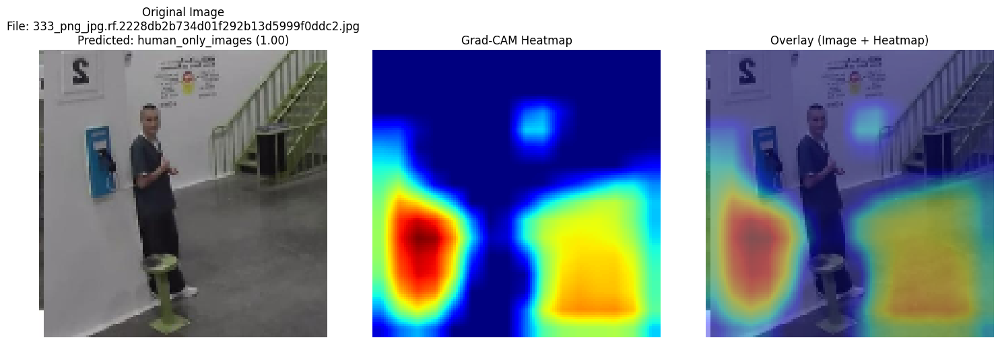

Predicted Class: human_only_images, Confidence: 1.00

Making predictions on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step

--- Classification Report ---
                   precision    recall  f1-score   support

human_only_images       0.81      1.00      0.89       398
suspicious_images       1.00      0.72      0.83       337

         accuracy                           0.87       735
        macro avg       0.90      0.86      0.86       735
     weighted avg       0.89      0.87      0.87       735


--- Confusion Matrix ---


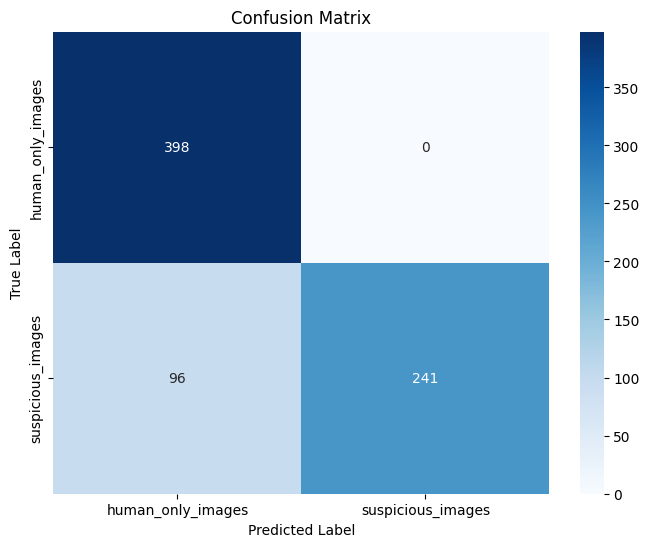


--- Correct Predictions and Misclassifications ---

Correct Predictions:
Total correct predictions: 639


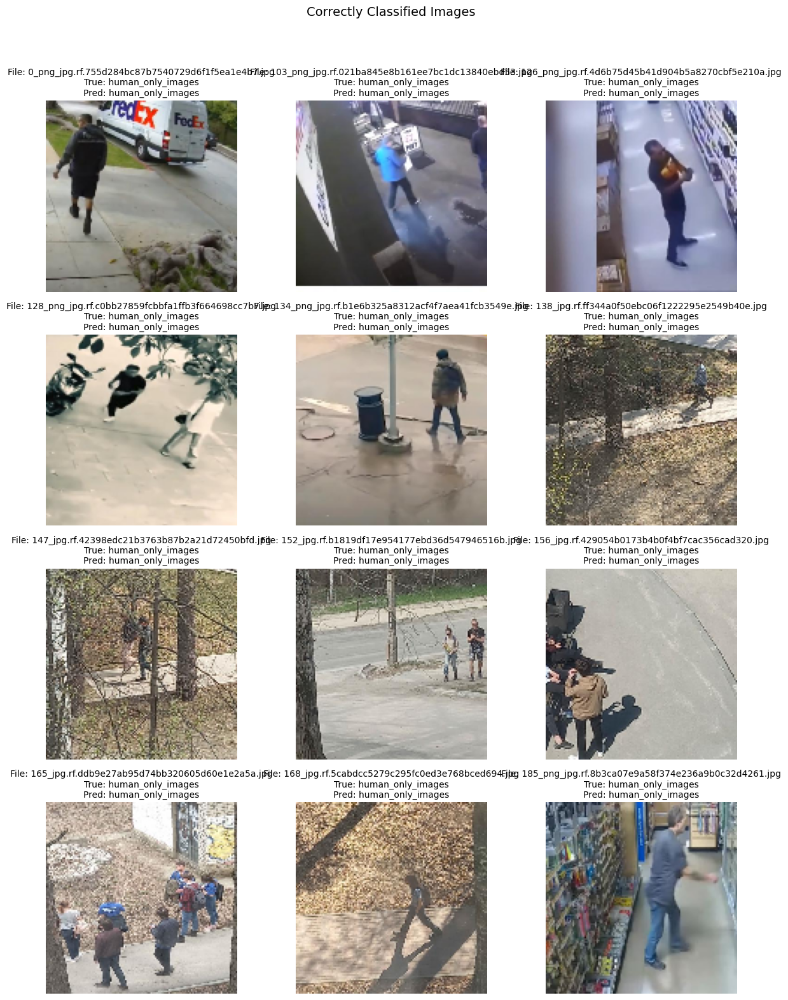


Misclassifications:
Total misclassifications: 96


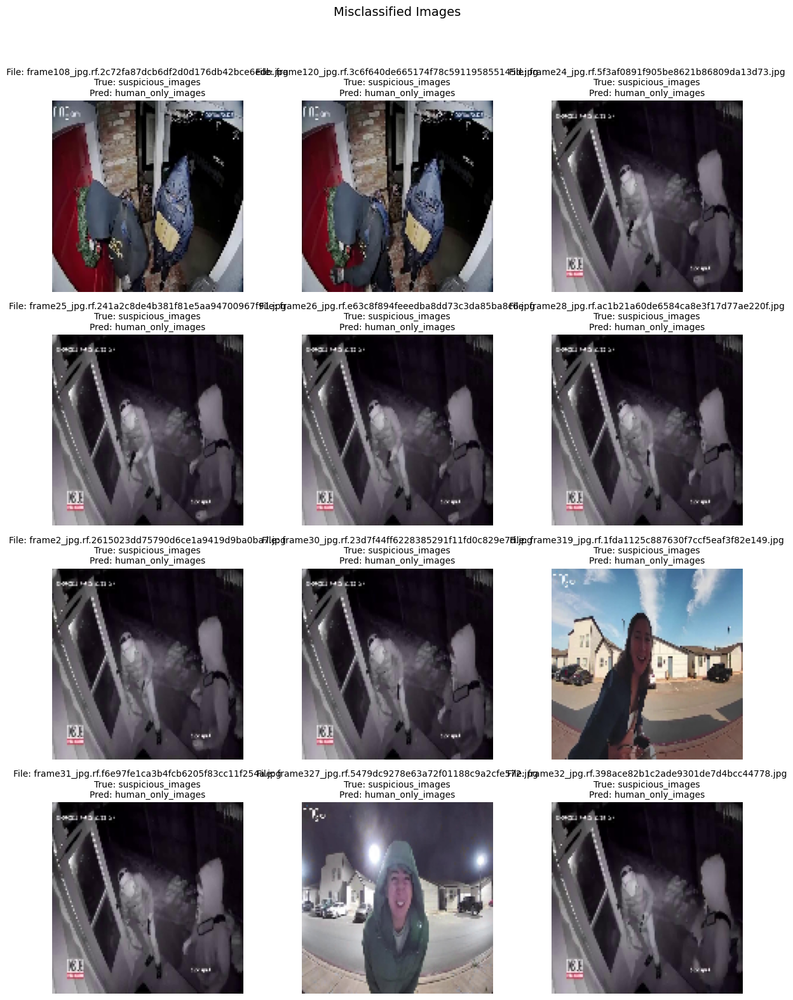

In [12]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os

# --- 1. Load the Saved Model and Prepare Test Data ---

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create an ImageDataGenerator for the test set (only rescaling, no augmentation)
test_image_generator = ImageDataGenerator(rescale=1./255)

# Create the data generator for the test data
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Get class labels
class_labels = list(test_data_gen.class_indices.keys())
print(f"Class Indices: {test_data_gen.class_indices}")

# --- 2. Function to Predict and Visualize a Specific Image ---

def predict_and_visualize_image(image_path, model, img_height=128, img_width=128, class_labels=None):
    """
    Predict the class of a specific image, display the original image, overlay, and heatmap.
    
    Parameters:
    - image_path: Path to the image file
    - model: Trained Keras model
    - img_height, img_width: Target image dimensions
    - class_labels: List of class names (e.g., ['human_only_images', 'suspicious_images'])
    
    Returns:
    - Predicted class and confidence
    """
    # Load and preprocess the image
    img = load_img(image_path, target_size=(img_height, img_width))
    img_array = img_to_array(img) / 255.0  # Rescale as done in training
    img_tensor = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # Predict class
    prediction = model.predict(img_tensor)
    predicted_class_idx = (prediction > 0.5).astype(int)[0][0]
    predicted_class = class_labels[predicted_class_idx]
    confidence = prediction[0][0] if predicted_class_idx == 1 else 1 - prediction[0][0]

    # Get the last convolutional layer for Grad-CAM
    last_conv_layer = None
    for layer in model.layers[::-1]:
        if 'conv' in layer.name.lower():
            last_conv_layer = layer
            break
    if last_conv_layer is None:
        print("Warning: No convolutional layer found for Grad-CAM.")
        heatmap = None
    else:
        # Create a sub-model for Grad-CAM
        grad_model = tf.keras.models.Model(
            inputs=[model.inputs],
            outputs=[last_conv_layer.output, model.output]
        )

        # Compute Grad-CAM heatmap
        with tf.GradientTape() as tape:
            conv_outputs, preds = grad_model(img_tensor)
            class_output = preds[:, 0]  # Binary classification: single output (sigmoid)

        grads = tape.gradient(class_output, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap + 1e-10)  # Normalize, avoid division by zero
        heatmap = heatmap.numpy()

        # Resize heatmap to match image size
        heatmap = tf.image.resize(heatmap[..., tf.newaxis], [img_height, img_width]).numpy()[..., 0]

    # Create figure for visualizations
    plt.figure(figsize=(15, 5))

    # Display original image
    plt.subplot(1, 3, 1)
    plt.imshow(img_array)
    plt.title(f"Original Image\nFile: {os.path.basename(image_path)}\nPredicted: {predicted_class} ({confidence:.2f})")
    plt.axis('off')

    # Display heatmap
    if heatmap is not None:
        plt.subplot(1, 3, 2)
        plt.imshow(heatmap, cmap='jet')
        plt.title("Grad-CAM Heatmap")
        plt.axis('off')

        # Display overlay (heatmap superimposed on original image)
        plt.subplot(1, 3, 3)
        plt.imshow(img_array)
        plt.imshow(heatmap, cmap='jet', alpha=0.4)
        plt.title("Overlay (Image + Heatmap)")
        plt.axis('off')
    else:
        plt.subplot(1, 3, 3)
        plt.text(0.5, 0.5, "Heatmap not available", ha='center', va='center')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return predicted_class, confidence

# --- 3. Example Usage of the Prediction Function ---

# Example image path (replace with an actual image path from your test set)
example_image_path = '/kaggle/working/sorted_data/test/human_only_images/333_png_jpg.rf.2228db2b734d01f292b13d5999f0ddc2.jpg'

print(f"\nPredicting for specific image: {example_image_path}")
predicted_class, confidence = predict_and_visualize_image(
    image_path=example_image_path,
    model=model,
    img_height=IMG_HEIGHT,
    img_width=IMG_WIDTH,
    class_labels=class_labels
)
print(f"Predicted Class: {predicted_class}, Confidence: {confidence:.2f}")

# --- 4. Run Original Evaluation ---

# Make predictions on the test set
print("\nMaking predictions on the test set...")
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions = model.predict(test_data_gen, steps=steps_for_prediction)
predicted_classes = (predictions > 0.5).astype(int)

# Display evaluation metrics
print("\n--- Classification Report ---")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

print("\n--- Confusion Matrix ---")
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Analyze and visualize correct predictions and misclassifications
print("\n--- Correct Predictions and Misclassifications ---")
filenames = test_data_gen.filenames
correct_predictions = []
incorrect_predictions = []

for i in range(len(filenames)):
    file_path = os.path.join(test_dir, filenames[i])
    true_label = true_classes[i]
    predicted_label = predicted_classes[i][0] if predicted_classes.ndim > 1 else predicted_classes[i]
    true_class_name = class_labels[true_label]
    predicted_class_name = class_labels[predicted_label]
    
    if true_label == predicted_label:
        correct_predictions.append((file_path, true_class_name, predicted_class_name))
    else:
        incorrect_predictions.append((file_path, true_class_name, predicted_class_name))

# Function to display images in a grid
def display_images(image_list, title, max_images=12):
    n_images = min(len(image_list), max_images)
    if n_images == 0:
        print(f"No images to display for {title}")
        return
    
    cols = 3
    rows = int(np.ceil(n_images / cols))
    plt.figure(figsize=(cols * 4, rows * 4))
    
    for i in range(n_images):
        file_path, true_class, pred_class = image_list[i]
        img = load_img(file_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = img_to_array(img) / 255.0
        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_array)
        plt.title(f"File: {os.path.basename(file_path)}\nTrue: {true_class}\nPred: {pred_class}", fontsize=10)
        plt.axis('off')
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Display correct predictions
print("\nCorrect Predictions:")
print(f"Total correct predictions: {len(correct_predictions)}")
display_images(correct_predictions, "Correctly Classified Images", max_images=12)

# Display misclassifications
print("\nMisclassifications:")
print(f"Total misclassifications: {len(incorrect_predictions)}")
display_images(incorrect_predictions, "Misclassified Images", max_images=12)

Loading trained model...
Found 735 images belonging to 2 classes.
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}

Predicting for specific image: /kaggle/working/sorted_data/test/human_only_images/470_png_jpg.rf.bcf406ba2ff6b023f0d0a54435c0c7c1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
Using layer: conv2d_4 for Grad-CAM


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


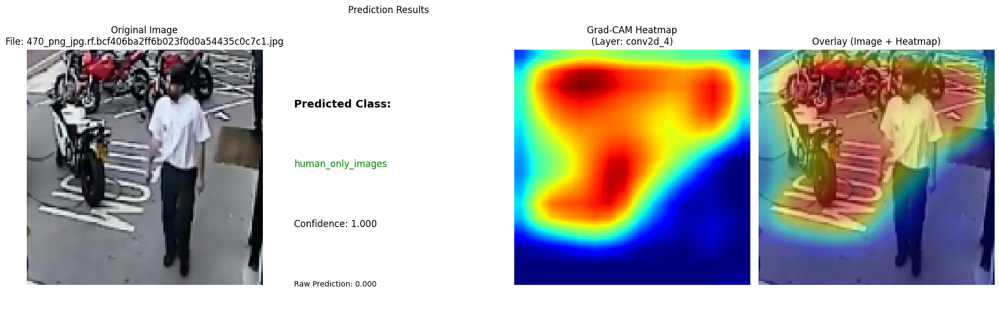

Predicted Class: human_only_images, Confidence: 1.000

Making predictions on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step

--- Classification Report ---
                   precision    recall  f1-score   support

human_only_images       0.81      1.00      0.89       398
suspicious_images       1.00      0.72      0.83       337

         accuracy                           0.87       735
        macro avg       0.90      0.86      0.86       735
     weighted avg       0.89      0.87      0.87       735


--- Confusion Matrix ---


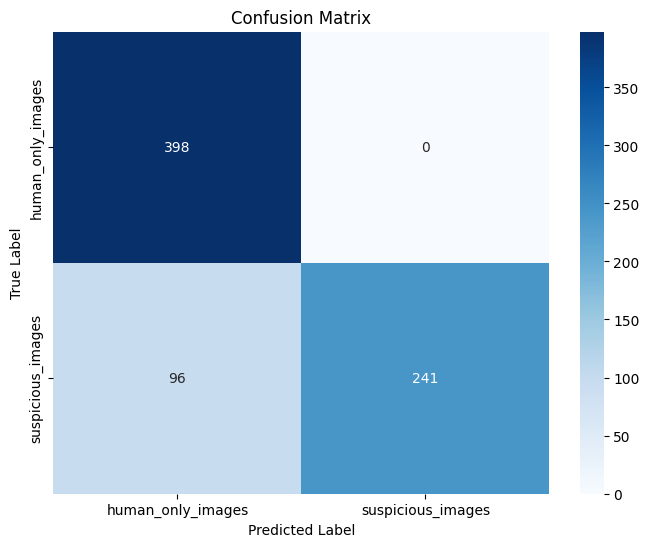


--- Correct Predictions and Misclassifications ---

Correct Predictions: 639


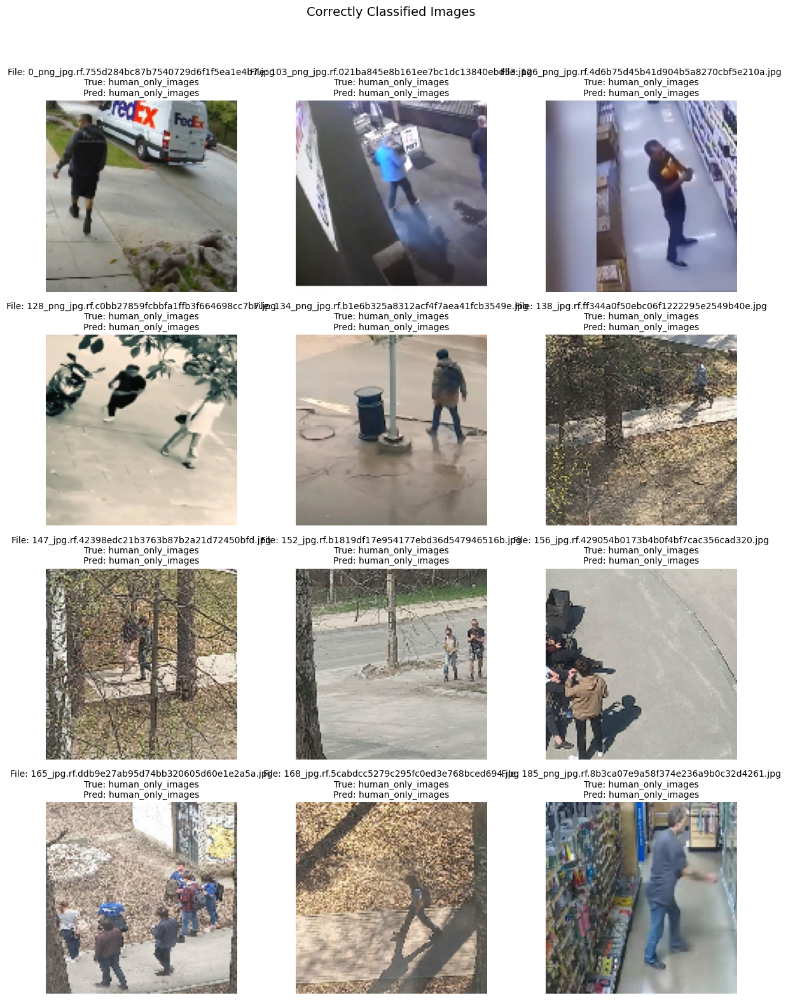


Misclassifications: 96


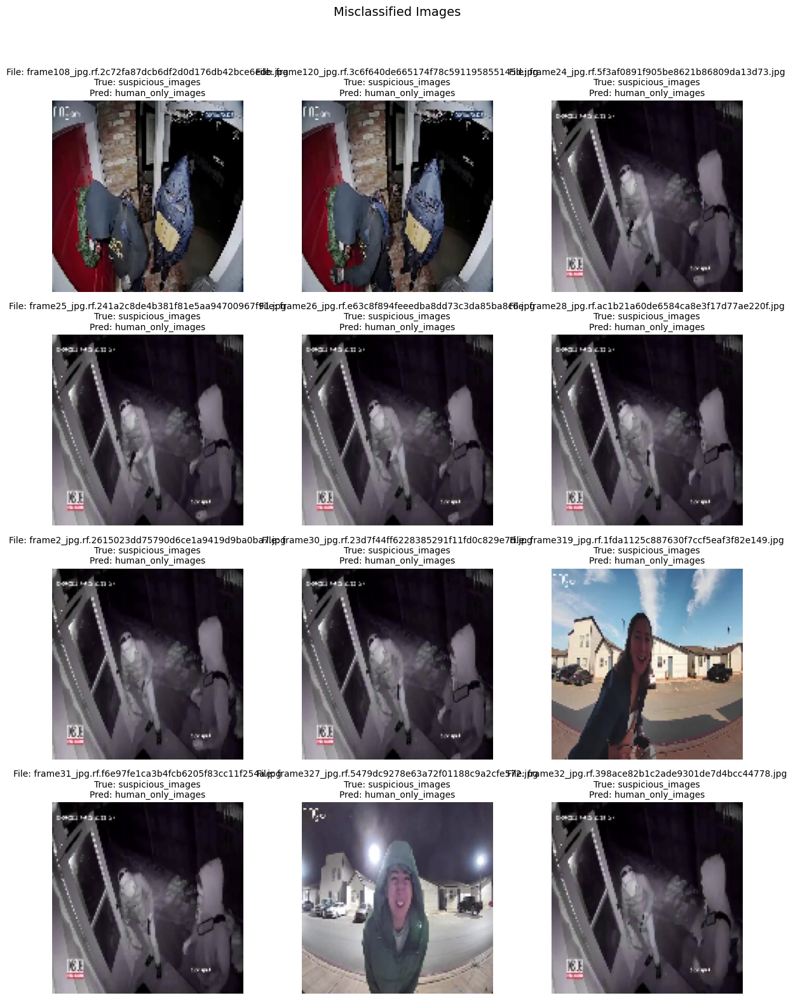


--- Detailed Analysis of Misclassified Images ---

--- Analyzing Image 1/3 ---
Path: /kaggle/working/sorted_data/test/suspicious_images/frame108_jpg.rf.2c72fa87dcb6df2d0d176db42bce6edb.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Using layer: conv2d_4 for Grad-CAM


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


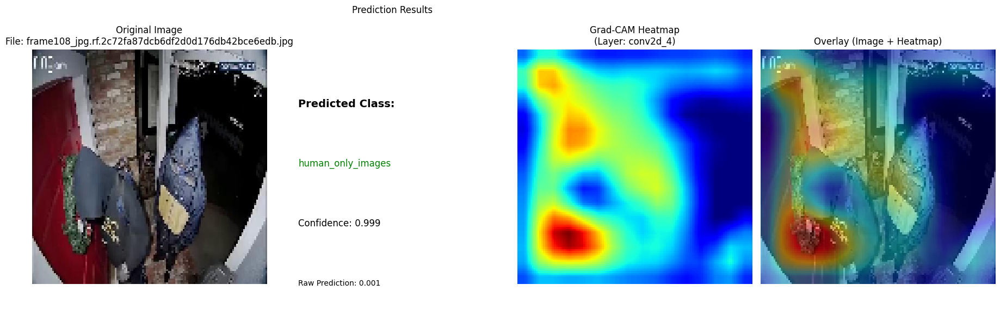

Result: human_only_images (Confidence: 0.999)
--------------------------------------------------

--- Analyzing Image 2/3 ---
Path: /kaggle/working/sorted_data/test/suspicious_images/frame120_jpg.rf.3c6f640de665174f78c591195855145d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Using layer: conv2d_4 for Grad-CAM


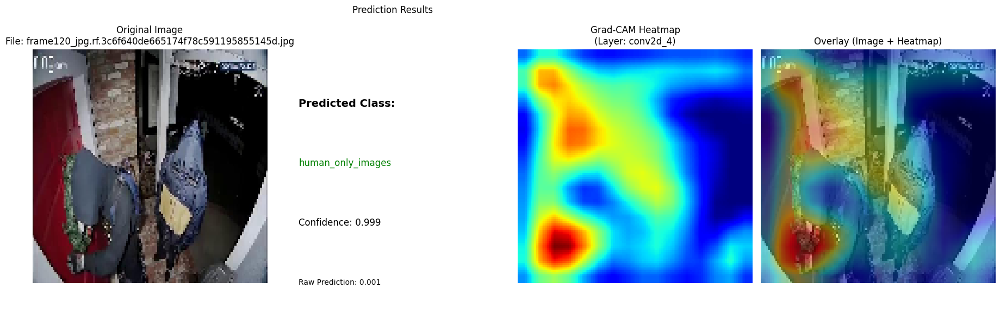

Result: human_only_images (Confidence: 0.999)
--------------------------------------------------

--- Analyzing Image 3/3 ---
Path: /kaggle/working/sorted_data/test/suspicious_images/frame24_jpg.rf.5f3af0891f905be8621b86809da13d73.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Using layer: conv2d_4 for Grad-CAM


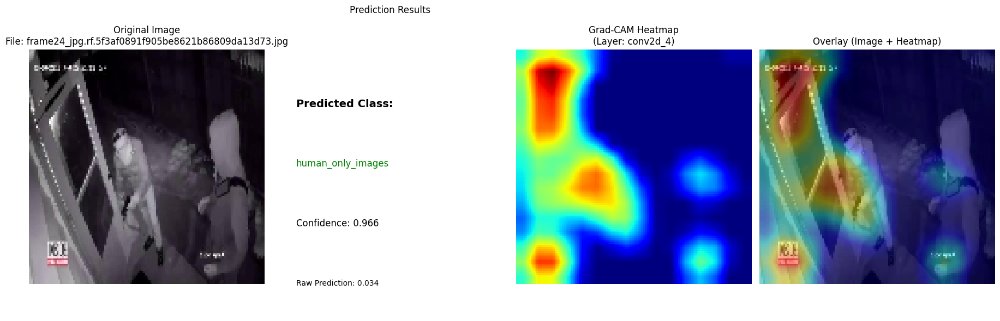

Result: human_only_images (Confidence: 0.966)
--------------------------------------------------


In [13]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os
import cv2

# --- 1. Load the Saved Model and Prepare Test Data ---

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create an ImageDataGenerator for the test set (only rescaling, no augmentation)
test_image_generator = ImageDataGenerator(rescale=1./255)

# Create the data generator for the test data
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Get class labels
class_labels = list(test_data_gen.class_indices.keys())
print(f"Class Indices: {test_data_gen.class_indices}")

# --- 2. Fixed Function to Predict and Visualize a Specific Image ---

def predict_and_visualize_image(image_path, model, img_height=128, img_width=128, class_labels=None):
    """
    Predict the class of a specific image, display the original image, overlay, and heatmap.
    
    Parameters:
    - image_path: Path to the image file
    - model: Trained Keras model
    - img_height, img_width: Target image dimensions
    - class_labels: List of class names (e.g., ['human_only_images', 'suspicious_images'])
    
    Returns:
    - Predicted class and confidence
    """
    # Load the original image and keep it for display
    original_img = load_img(image_path, target_size=(img_height, img_width))
    original_img_array = img_to_array(original_img)  # Keep original scale for display
    
    # Create preprocessed image for model prediction (same as training)
    preprocessed_img_array = original_img_array / 255.0  # Rescale for model
    img_tensor = np.expand_dims(preprocessed_img_array, axis=0)  # Add batch dimension

    # Predict class
    prediction = model.predict(img_tensor)
    predicted_class_idx = (prediction > 0.5).astype(int)[0][0]
    predicted_class = class_labels[predicted_class_idx]
    confidence = prediction[0][0] if predicted_class_idx == 1 else 1 - prediction[0][0]

    # Get the last convolutional layer for Grad-CAM
    last_conv_layer = None
    for layer in model.layers[::-1]:
        if 'conv' in layer.name.lower():
            last_conv_layer = layer
            break
    
    if last_conv_layer is None:
        print("Warning: No convolutional layer found for Grad-CAM.")
        heatmap = None
    else:
        print(f"Using layer: {last_conv_layer.name} for Grad-CAM")
        
        # Create a sub-model for Grad-CAM
        grad_model = tf.keras.models.Model(
            inputs=[model.inputs],
            outputs=[last_conv_layer.output, model.output]
        )

        # Compute Grad-CAM heatmap
        with tf.GradientTape() as tape:
            conv_outputs, preds = grad_model(img_tensor)
            # For binary classification, use the predicted class output
            if predicted_class_idx == 1:
                class_output = preds[:, 0]  # Suspicious class
            else:
                class_output = 1 - preds[:, 0]  # Human only class

        # Calculate gradients
        grads = tape.gradient(class_output, conv_outputs)
        
        # Pool the gradients over all the axes leaving out the channel dimension
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        
        # Multiply each channel in the feature map array by "how important this channel is"
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        
        # Normalize the heatmap
        heatmap = tf.maximum(heatmap, 0)  # ReLU
        max_heat = tf.reduce_max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap = heatmap / max_heat
        heatmap = heatmap.numpy()

        # Resize heatmap to match image size using OpenCV for better alignment
        heatmap_resized = cv2.resize(heatmap, (img_width, img_height))
        
        # Apply colormap to heatmap
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create figure for visualizations
    plt.figure(figsize=(18, 6))

    # Display original image (normalized for display)
    plt.subplot(1, 4, 1)
    plt.imshow(original_img_array.astype(np.uint8))
    plt.title(f"Original Image\nFile: {os.path.basename(image_path)}")
    plt.axis('off')

    # Display prediction info
    plt.subplot(1, 4, 2)
    plt.text(0.1, 0.7, f"Predicted Class:", fontsize=14, fontweight='bold')
    plt.text(0.1, 0.5, f"{predicted_class}", fontsize=12, 
             color='red' if predicted_class == 'suspicious_images' else 'green')
    plt.text(0.1, 0.3, f"Confidence: {confidence:.3f}", fontsize=12)
    plt.text(0.1, 0.1, f"Raw Prediction: {prediction[0][0]:.3f}", fontsize=10)
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title("Prediction Results")

    if heatmap is not None:
        # Display heatmap
        plt.subplot(1, 4, 3)
        plt.imshow(heatmap_resized, cmap='jet')
        plt.title(f"Grad-CAM Heatmap\n(Layer: {last_conv_layer.name})")
        plt.axis('off')

        # Display overlay with proper alignment
        plt.subplot(1, 4, 4)
        # Convert original image to proper format for overlay
        display_img = original_img_array.astype(np.uint8)
        
        # Create overlay by blending images
        overlay = cv2.addWeighted(display_img, 0.6, heatmap_colored, 0.4, 0)
        
        plt.imshow(overlay)
        plt.title("Overlay (Image + Heatmap)")
        plt.axis('off')
    else:
        plt.subplot(1, 4, 3)
        plt.text(0.5, 0.5, "Heatmap not available\n(No conv layers found)", 
                ha='center', va='center', fontsize=12)
        plt.axis('off')
        
        plt.subplot(1, 4, 4)
        plt.text(0.5, 0.5, "Overlay not available", ha='center', va='center', fontsize=12)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return predicted_class, confidence

# --- 3. Enhanced Batch Prediction Function ---

def analyze_multiple_images(image_paths, model, img_height=128, img_width=128, class_labels=None):
    """
    Analyze multiple images and show their Grad-CAM visualizations
    """
    for i, image_path in enumerate(image_paths):
        print(f"\n--- Analyzing Image {i+1}/{len(image_paths)} ---")
        print(f"Path: {image_path}")
        
        if os.path.exists(image_path):
            predicted_class, confidence = predict_and_visualize_image(
                image_path=image_path,
                model=model,
                img_height=img_height,
                img_width=img_width,
                class_labels=class_labels
            )
            print(f"Result: {predicted_class} (Confidence: {confidence:.3f})")
        else:
            print(f"Image not found: {image_path}")
        
        print("-" * 50)

# --- 4. Example Usage of the Fixed Prediction Function ---

# Example image path (replace with an actual image path from your test set)
example_image_path = '/kaggle/working/sorted_data/test/human_only_images/470_png_jpg.rf.bcf406ba2ff6b023f0d0a54435c0c7c1.jpg'
print(f"\nPredicting for specific image: {example_image_path}")
if os.path.exists(example_image_path):
    predicted_class, confidence = predict_and_visualize_image(
        image_path=example_image_path,
        model=model,
        img_height=IMG_HEIGHT,
        img_width=IMG_WIDTH,
        class_labels=class_labels
    )
    print(f"Predicted Class: {predicted_class}, Confidence: {confidence:.3f}")
else:
    print("Example image not found. Please update the path.")

# --- 5. Run Original Evaluation with Bug Fix ---

# Get true classes properly
true_classes = test_data_gen.classes

# Make predictions on the test set
print("\nMaking predictions on the test set...")
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions = model.predict(test_data_gen, steps=steps_for_prediction)
predicted_classes = (predictions > 0.5).astype(int)

# Display evaluation metrics
print("\n--- Classification Report ---")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

print("\n--- Confusion Matrix ---")
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Analyze and visualize correct predictions and misclassifications
print("\n--- Correct Predictions and Misclassifications ---")
filenames = test_data_gen.filenames
correct_predictions = []
incorrect_predictions = []

for i in range(len(filenames)):
    file_path = os.path.join(test_dir, filenames[i])
    true_label = true_classes[i]
    predicted_label = predicted_classes[i][0] if predicted_classes.ndim > 1 else predicted_classes[i]
    true_class_name = class_labels[true_label]
    predicted_class_name = class_labels[predicted_label]
    
    if true_label == predicted_label:
        correct_predictions.append((file_path, true_class_name, predicted_class_name))
    else:
        incorrect_predictions.append((file_path, true_class_name, predicted_class_name))

# Function to display images in a grid
def display_images(image_list, title, max_images=12):
    n_images = min(len(image_list), max_images)
    if n_images == 0:
        print(f"No images to display for {title}")
        return
    
    cols = 3
    rows = int(np.ceil(n_images / cols))
    plt.figure(figsize=(cols * 4, rows * 4))
    
    for i in range(n_images):
        file_path, true_class, pred_class = image_list[i]
        img = load_img(file_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = img_to_array(img)
        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_array.astype(np.uint8))
        plt.title(f"File: {os.path.basename(file_path)}\nTrue: {true_class}\nPred: {pred_class}", fontsize=10)
        plt.axis('off')
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Display correct predictions
print(f"\nCorrect Predictions: {len(correct_predictions)}")
display_images(correct_predictions, "Correctly Classified Images", max_images=12)

# Display misclassifications
print(f"\nMisclassifications: {len(incorrect_predictions)}")
display_images(incorrect_predictions, "Misclassified Images", max_images=12)

# --- 6. Analyze Specific Misclassified Images with Grad-CAM ---
if len(incorrect_predictions) > 0:
    print("\n--- Detailed Analysis of Misclassified Images ---")
    # Analyze first few misclassified images with Grad-CAM
    sample_incorrect = incorrect_predictions[:3]  # Analyze first 3 misclassifications
    incorrect_paths = [item[0] for item in sample_incorrect]
    
    analyze_multiple_images(
        image_paths=incorrect_paths,
        model=model,
        img_height=IMG_HEIGHT,
        img_width=IMG_WIDTH,
        class_labels=class_labels
    )

Loading trained model...
Found 735 images belonging to 2 classes.
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}
Creating publication-ready single image analysis...
Figure saved to: gradcam_analysis.png


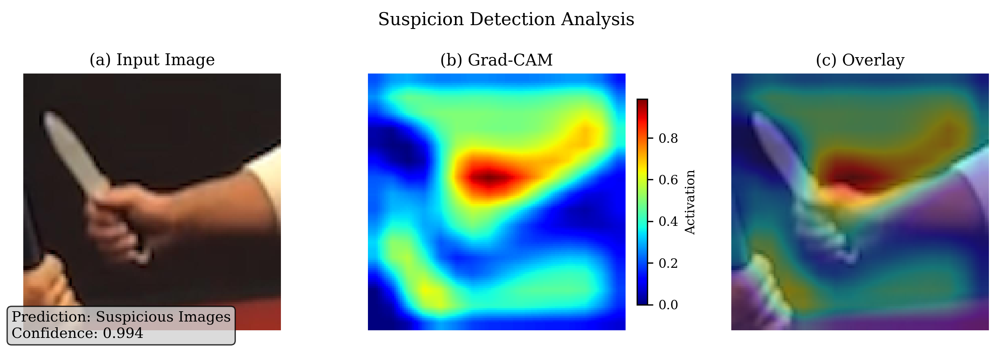

Result: suspicious_images (Confidence: 0.994)

Making predictions on test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Creating publication-ready confusion matrix...
Confusion matrix saved to: confusion_matrix.png


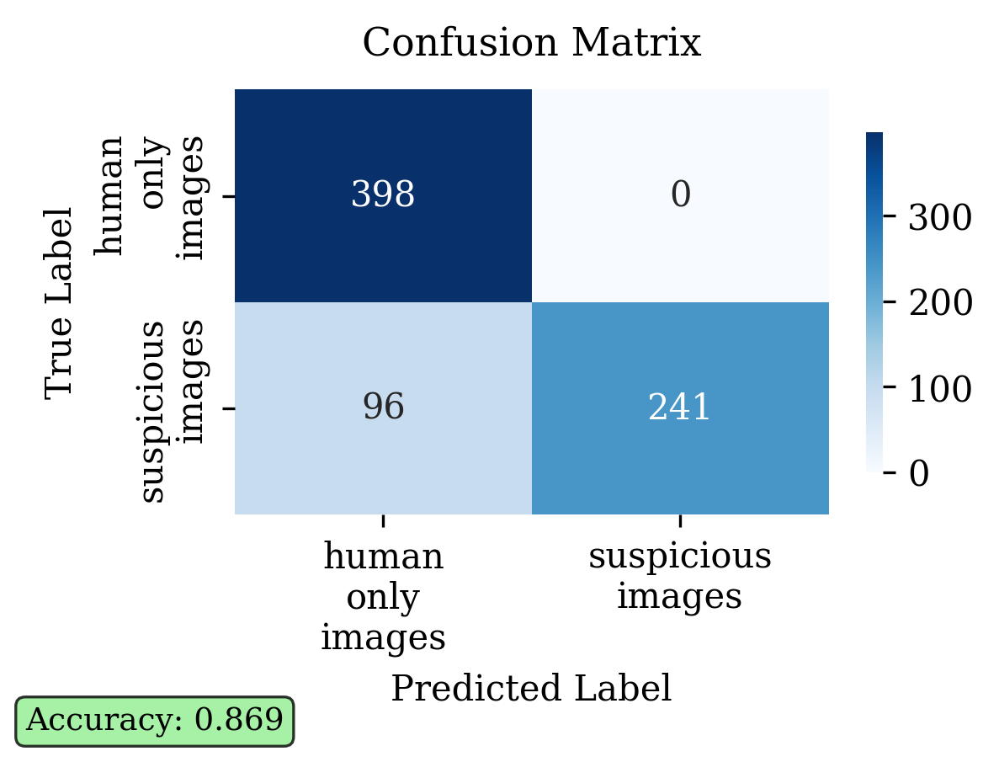


--- Classification Report ---
                   precision    recall  f1-score   support

human_only_images       0.81      1.00      0.89       398
suspicious_images       1.00      0.72      0.83       337

         accuracy                           0.87       735
        macro avg       0.90      0.86      0.86       735
     weighted avg       0.89      0.87      0.87       735


Correct predictions: 639
Misclassifications: 96

Creating comparison figure with mixed examples...


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


Comparison figure saved to: detection_comparison.png


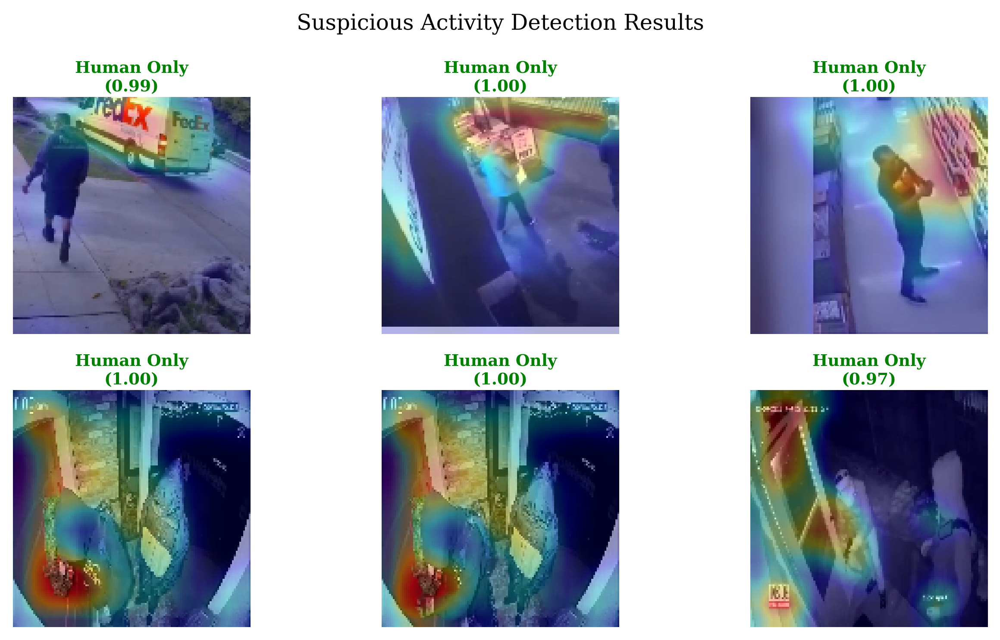


Publication-ready figures created successfully!
Files generated:
1. gradcam_analysis.png - Single image Grad-CAM analysis
2. confusion_matrix.png - Confusion matrix
3. detection_comparison.png - Multi-image comparison


In [14]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os
import cv2

# Set matplotlib parameters for publication quality
plt.rcParams.update({
    'font.size': 10,
    'font.family': 'serif',
    'axes.linewidth': 0.8,
    'grid.linewidth': 0.8,
    'lines.linewidth': 1.0,
    'patch.linewidth': 0.8,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
    'xtick.minor.width': 0.6,
    'ytick.minor.width': 0.6,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1
})

# --- 1. Load the Saved Model and Prepare Test Data ---

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create an ImageDataGenerator for the test set (only rescaling, no augmentation)
test_image_generator = ImageDataGenerator(rescale=1./255)

# Create the data generator for the test data
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Get class labels
class_labels = list(test_data_gen.class_indices.keys())
print(f"Class Indices: {test_data_gen.class_indices}")

# --- 2. Publication-Ready Prediction and Visualization Function ---

def predict_and_visualize_paper_format(image_path, model, img_height=128, img_width=128, 
                                      class_labels=None, save_path=None, show_title=True):
    """
    Create publication-ready visualization with optimal space usage for conference papers.
    
    Parameters:
    - image_path: Path to the image file
    - model: Trained Keras model
    - img_height, img_width: Target image dimensions
    - class_labels: List of class names
    - save_path: Path to save the figure (optional)
    - show_title: Whether to show main title
    
    Returns:
    - Predicted class and confidence
    """
    # Load and preprocess image
    original_img = load_img(image_path, target_size=(img_height, img_width))
    original_img_array = img_to_array(original_img)
    preprocessed_img_array = original_img_array / 255.0
    img_tensor = np.expand_dims(preprocessed_img_array, axis=0)

    # Predict class
    prediction = model.predict(img_tensor, verbose=0)
    predicted_class_idx = (prediction > 0.5).astype(int)[0][0]
    predicted_class = class_labels[predicted_class_idx]
    confidence = prediction[0][0] if predicted_class_idx == 1 else 1 - prediction[0][0]

    # Get the last convolutional layer for Grad-CAM
    last_conv_layer = None
    for layer in model.layers[::-1]:
        if 'conv' in layer.name.lower():
            last_conv_layer = layer
            break
    
    heatmap_resized = None
    heatmap_colored = None
    
    if last_conv_layer is not None:
        # Create Grad-CAM
        grad_model = tf.keras.models.Model(
            inputs=[model.inputs],
            outputs=[last_conv_layer.output, model.output]
        )

        with tf.GradientTape() as tape:
            conv_outputs, preds = grad_model(img_tensor)
            if predicted_class_idx == 1:
                class_output = preds[:, 0]
            else:
                class_output = 1 - preds[:, 0]

        grads = tape.gradient(class_output, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0)
        max_heat = tf.reduce_max(heatmap)
        if max_heat == 0:
            max_heat = 1e-10
        heatmap = heatmap / max_heat
        heatmap = heatmap.numpy()

        heatmap_resized = cv2.resize(heatmap, (img_width, img_height))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create compact figure for paper
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))  # Compact size for papers
    
    # Adjust spacing
    plt.subplots_adjust(wspace=0.05, hspace=0.1)
    
    # Original image
    axes[0].imshow(original_img_array.astype(np.uint8))
    axes[0].set_title('(a) Input Image', fontsize=10, pad=5)
    axes[0].axis('off')

    # Heatmap
    if heatmap_resized is not None:
        im1 = axes[1].imshow(heatmap_resized, cmap='jet')
        axes[1].set_title('(b) Grad-CAM', fontsize=10, pad=5)
        axes[1].axis('off')
        
        # Add compact colorbar
        cbar1 = plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, shrink=0.8)
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_label('Activation', fontsize=8)
    else:
        axes[1].text(0.5, 0.5, 'No Heatmap\nAvailable', ha='center', va='center', 
                    fontsize=9, transform=axes[1].transAxes)
        axes[1].set_title('(b) Grad-CAM', fontsize=10, pad=5)
        axes[1].axis('off')

    # Overlay
    if heatmap_colored is not None:
        display_img = original_img_array.astype(np.uint8)
        overlay = cv2.addWeighted(display_img, 0.6, heatmap_colored, 0.4, 0)
        axes[2].imshow(overlay)
        axes[2].set_title('(c) Overlay', fontsize=10, pad=5)
    else:
        axes[2].imshow(original_img_array.astype(np.uint8))
        axes[2].set_title('(c) Input Image', fontsize=10, pad=5)
    axes[2].axis('off')

    # Add prediction text in a compact format
    pred_text = f"Prediction: {predicted_class.replace('_', ' ').title()}\nConfidence: {confidence:.3f}"
    fig.text(0.02, 0.02, pred_text, fontsize=9, verticalalignment='bottom',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgray', alpha=0.8))

    if show_title:
        # Clean filename for title
        clean_filename = os.path.basename(image_path).replace('_', ' ')
        if len(clean_filename) > 50:
            clean_filename = clean_filename[:47] + "..."
        fig.suptitle(f"Suspicion Detection Analysis", fontsize=11, y=0.98)

    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Figure saved to: {save_path}")
    
    plt.show()
    
    return predicted_class, confidence

# --- 3. Multi-Image Comparison for Papers ---

def create_paper_comparison(image_paths, model, img_height=128, img_width=128, 
                           class_labels=None, save_path=None, max_images=6):
    """
    Create a comparison figure showing multiple examples for conference papers.
    Optimized for 2-column paper format.
    """
    n_images = min(len(image_paths), max_images)
    
    # Calculate optimal layout
    if n_images <= 2:
        rows, cols = 1, n_images
        figsize = (6, 2.5)
    elif n_images <= 4:
        rows, cols = 2, 2
        figsize = (6, 5)
    elif n_images <= 6:
        rows, cols = 2, 3
        figsize = (9, 5)
    else:
        rows, cols = 3, 3
        figsize = (9, 7)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if n_images == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes.flatten() if n_images > 1 else [axes]
    else:
        axes = axes.flatten()
    
    results = []
    
    for i in range(n_images):
        if i < len(image_paths) and os.path.exists(image_paths[i]):
            # Process image
            original_img = load_img(image_paths[i], target_size=(img_height, img_width))
            original_img_array = img_to_array(original_img)
            preprocessed_img_array = original_img_array / 255.0
            img_tensor = np.expand_dims(preprocessed_img_array, axis=0)
            
            # Predict
            prediction = model.predict(img_tensor, verbose=0)
            predicted_class_idx = (prediction > 0.5).astype(int)[0][0]
            predicted_class = class_labels[predicted_class_idx]
            confidence = prediction[0][0] if predicted_class_idx == 1 else 1 - prediction[0][0]
            
            # Create overlay if possible
            last_conv_layer = None
            for layer in model.layers[::-1]:
                if 'conv' in layer.name.lower():
                    last_conv_layer = layer
                    break
            
            if last_conv_layer is not None:
                grad_model = tf.keras.models.Model(
                    inputs=[model.inputs],
                    outputs=[last_conv_layer.output, model.output]
                )
                
                with tf.GradientTape() as tape:
                    conv_outputs, preds = grad_model(img_tensor)
                    if predicted_class_idx == 1:
                        class_output = preds[:, 0]
                    else:
                        class_output = 1 - preds[:, 0]
                
                grads = tape.gradient(class_output, conv_outputs)
                pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
                
                conv_outputs = conv_outputs[0]
                heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
                heatmap = tf.squeeze(heatmap)
                heatmap = tf.maximum(heatmap, 0)
                max_heat = tf.reduce_max(heatmap)
                if max_heat > 0:
                    heatmap = heatmap / max_heat
                    heatmap_resized = cv2.resize(heatmap.numpy(), (img_width, img_height))
                    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
                    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
                    
                    # Create overlay
                    display_img = original_img_array.astype(np.uint8)
                    overlay = cv2.addWeighted(display_img, 0.7, heatmap_colored, 0.3, 0)
                    axes[i].imshow(overlay)
                else:
                    axes[i].imshow(original_img_array.astype(np.uint8))
            else:
                axes[i].imshow(original_img_array.astype(np.uint8))
            
            # Title with prediction
            class_short = predicted_class.replace('_images', '').replace('_', ' ').title()
            color = 'red' if 'suspicious' in predicted_class.lower() else 'green'
            axes[i].set_title(f"{class_short}\n({confidence:.2f})", 
                            fontsize=9, pad=3, color=color, weight='bold')
            axes[i].axis('off')
            
            results.append((predicted_class, confidence))
        
        else:
            axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(n_images, len(axes)):
        axes[j].axis('off')
    
    plt.suptitle("Suspicious Activity Detection Results", fontsize=12, y=0.98)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Comparison figure saved to: {save_path}")
    
    plt.show()
    
    return results

# --- 4. Confusion Matrix for Papers ---

def create_paper_confusion_matrix(true_classes, predicted_classes, class_labels, save_path=None):
    """
    Create a publication-ready confusion matrix.
    """
    cm = confusion_matrix(true_classes, predicted_classes)
    
    fig, ax = plt.subplots(figsize=(4, 3))
    
    # Create heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[label.replace('_', '\n') for label in class_labels],
                yticklabels=[label.replace('_', '\n') for label in class_labels],
                cbar_kws={'shrink': 0.8}, ax=ax)
    
    ax.set_title('Confusion Matrix', fontsize=11, pad=10)
    ax.set_ylabel('True Label', fontsize=10)
    ax.set_xlabel('Predicted Label', fontsize=10)
    
    # Calculate accuracy
    accuracy = np.trace(cm) / np.sum(cm)
    fig.text(0.02, 0.02, f'Accuracy: {accuracy:.3f}', fontsize=9,
             bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgreen', alpha=0.8))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Confusion matrix saved to: {save_path}")
    
    plt.show()

# --- 5. Example Usage for Paper ---

# Single image analysis
example_image_path = '/kaggle/working/sorted_data/test/suspicious_images/rgb-0000083_jpg.rf.389c909d3818ad579468daeacb896d93.jpg'

print("Creating publication-ready single image analysis...")
if os.path.exists(example_image_path):
    predicted_class, confidence = predict_and_visualize_paper_format(
        image_path=example_image_path,
        model=model,
        img_height=IMG_HEIGHT,
        img_width=IMG_WIDTH,
        class_labels=class_labels,
        save_path='gradcam_analysis.png'
    )
    print(f"Result: {predicted_class} (Confidence: {confidence:.3f})")

# --- 6. Run Evaluation and Create Paper Figures ---

# Get true classes
true_classes = test_data_gen.classes

# Make predictions
print("\nMaking predictions on test set...")
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions = model.predict(test_data_gen, steps=steps_for_prediction, verbose=0)
predicted_classes = (predictions > 0.5).astype(int)

# Create confusion matrix
print("\nCreating publication-ready confusion matrix...")
create_paper_confusion_matrix(true_classes, predicted_classes, class_labels, 
                             save_path='confusion_matrix.png')

# Classification report
print("\n--- Classification Report ---")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Find examples for comparison figure
filenames = test_data_gen.filenames
correct_predictions = []
incorrect_predictions = []

for i in range(len(filenames)):
    file_path = os.path.join(test_dir, filenames[i])
    true_label = true_classes[i]
    predicted_label = predicted_classes[i][0] if predicted_classes.ndim > 1 else predicted_classes[i]
    
    if true_label == predicted_label:
        correct_predictions.append(file_path)
    else:
        incorrect_predictions.append(file_path)

# Create comparison figure with mixed examples
print(f"\nCorrect predictions: {len(correct_predictions)}")
print(f"Misclassifications: {len(incorrect_predictions)}")

if len(correct_predictions) >= 3 and len(incorrect_predictions) >= 3:
    mixed_examples = correct_predictions[:3] + incorrect_predictions[:3]
    print("\nCreating comparison figure with mixed examples...")
    results = create_paper_comparison(
        image_paths=mixed_examples,
        model=model,
        img_height=IMG_HEIGHT,
        img_width=IMG_WIDTH,
        class_labels=class_labels,
        save_path='detection_comparison.png',
        max_images=6
    )

print("\nPublication-ready figures created successfully!")
print("Files generated:")
print("1. gradcam_analysis.png - Single image Grad-CAM analysis")
print("2. confusion_matrix.png - Confusion matrix")
print("3. detection_comparison.png - Multi-image comparison")

Loading trained model...
Found 735 images belonging to 2 classes.
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}
Class Names: ['Human Only Images', 'Suspicious Images']
Making predictions on test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Total samples: 735
Predictions shape: (735,)

=== EXPERIMENTAL RESULTS GENERATION ===
Creating comprehensive evaluation metrics for publication...

1. Creating results table...
Results table saved to: results_table.png


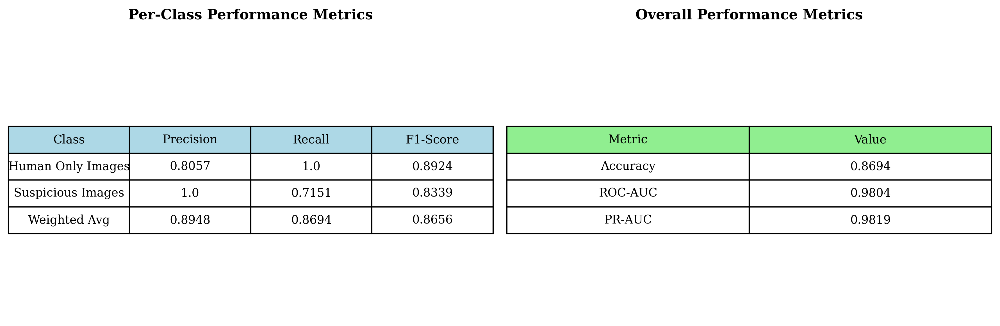


2. Creating confusion matrix...
Confusion matrix saved to: confusion_matrix.png


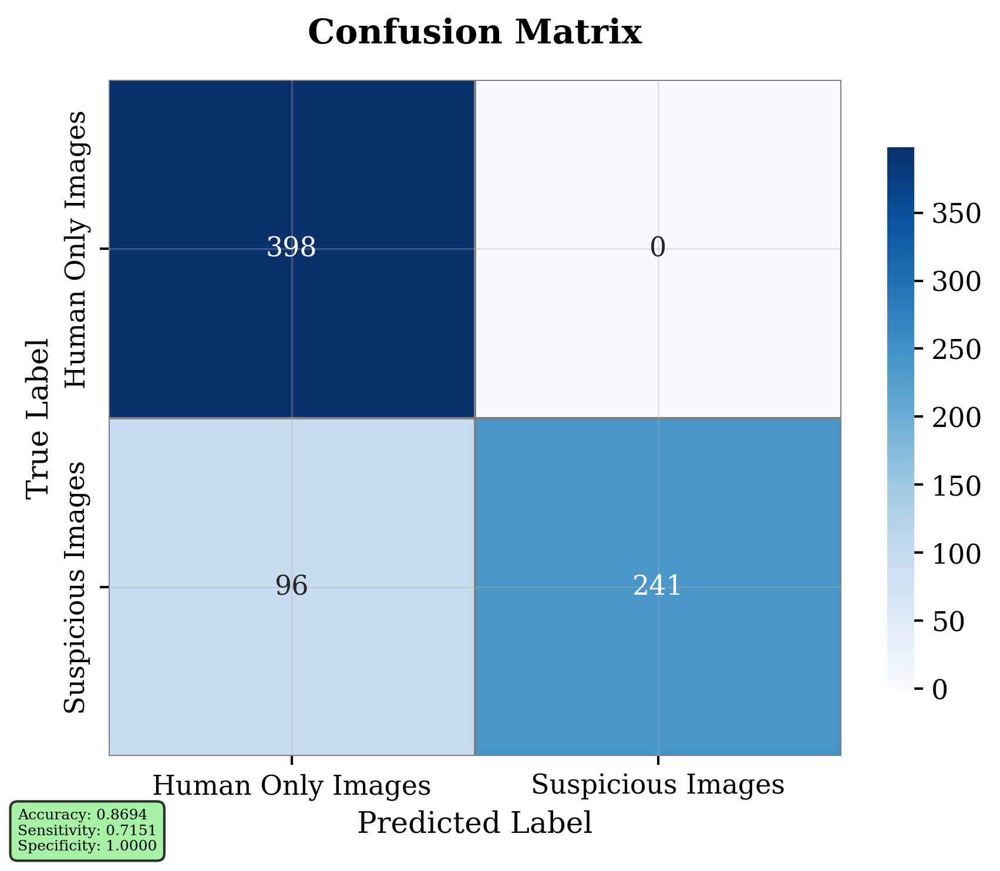


3. Creating ROC curve...
ROC curve saved to: roc_curve.png


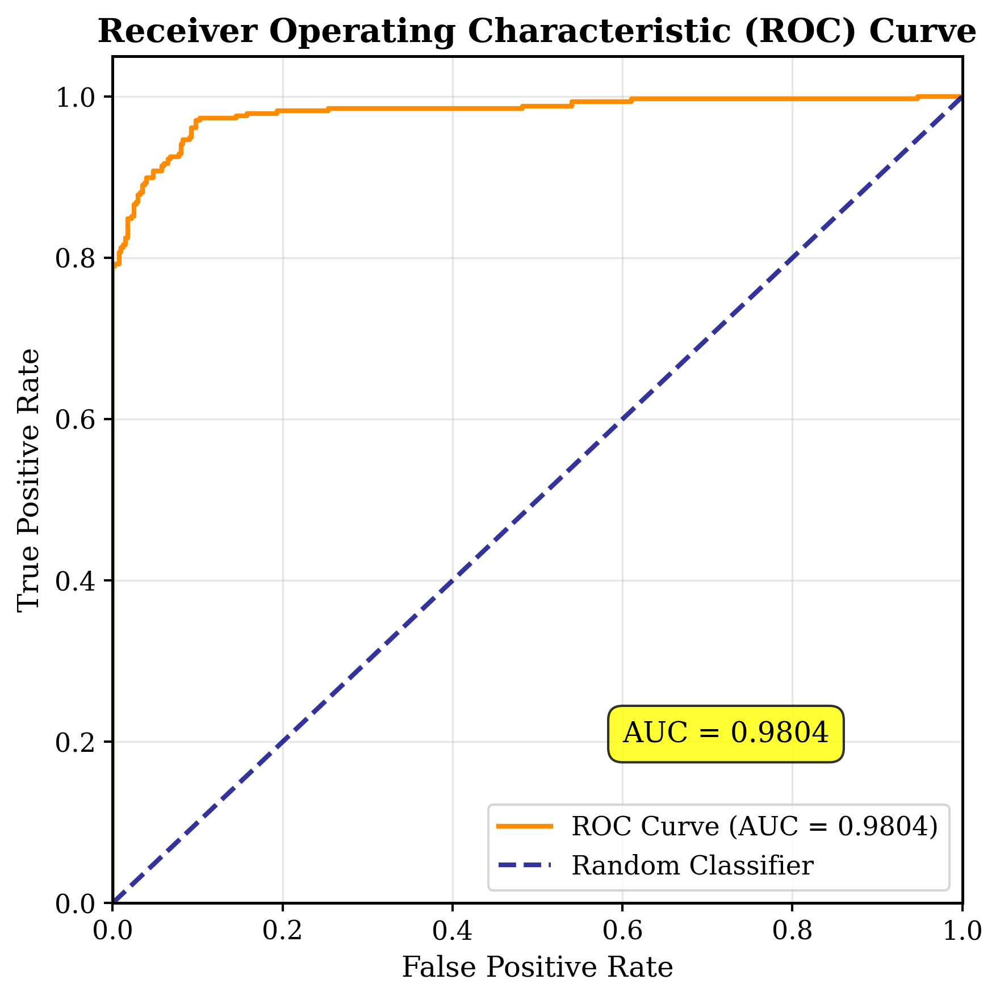


4. Creating Precision-Recall curve...
Precision-Recall curve saved to: precision_recall_curve.png


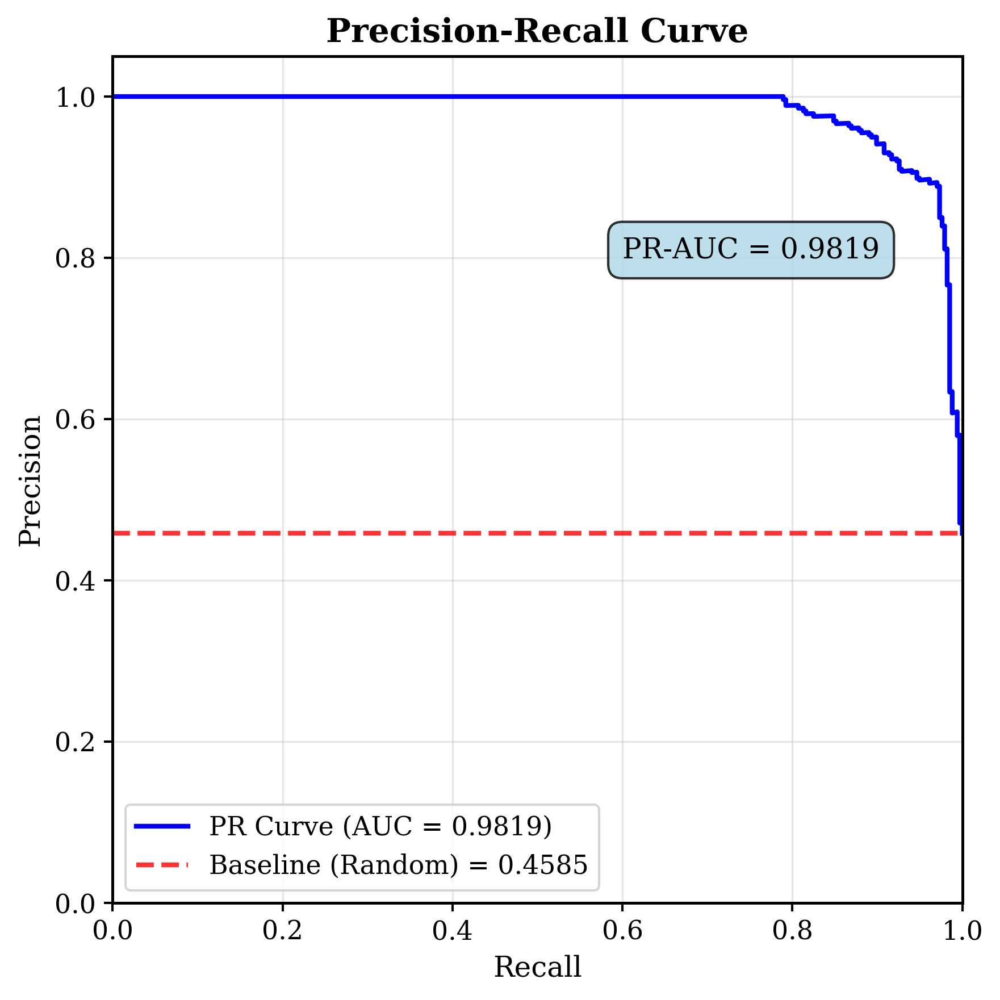


5. Creating combined metrics visualization...
Combined metrics plot saved to: combined_metrics.png


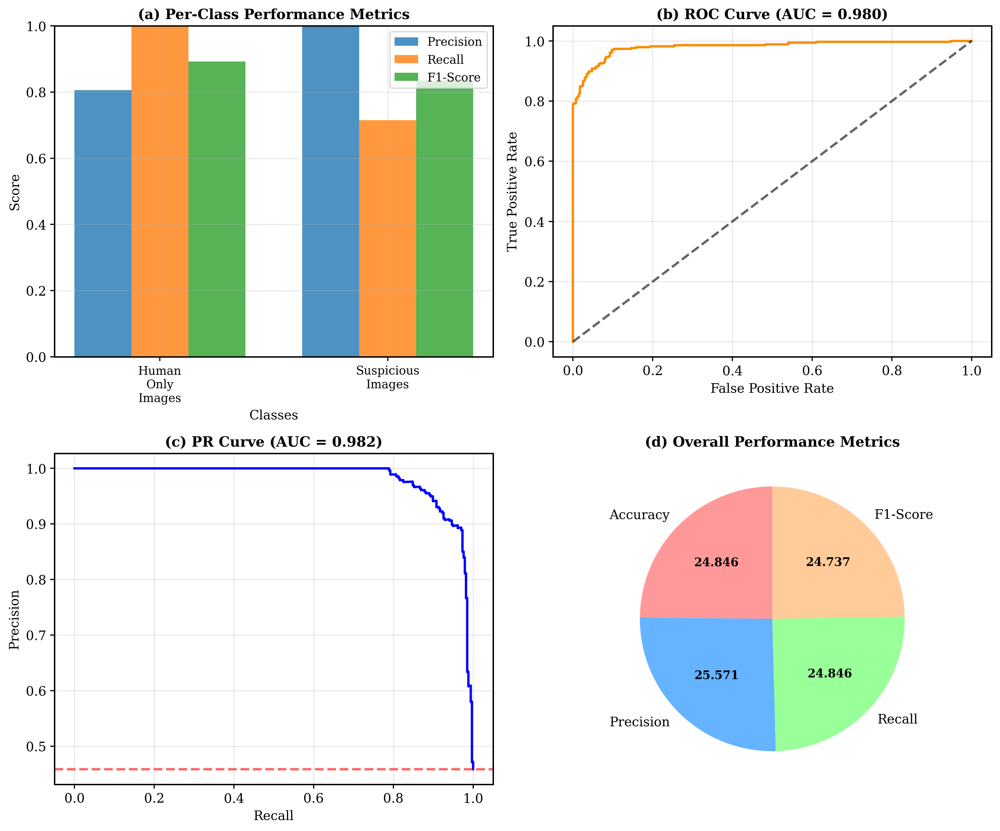


=== DETAILED CLASSIFICATION REPORT ===
                   precision    recall  f1-score   support

Human Only Images     0.8057    1.0000    0.8924       398
Suspicious Images     1.0000    0.7151    0.8339       337

         accuracy                         0.8694       735
        macro avg     0.9028    0.8576    0.8631       735
     weighted avg     0.8948    0.8694    0.8656       735


=== SUMMARY STATISTICS ===
Total Test Samples: 735
Accuracy: 0.8694
Weighted Precision: 0.8948
Weighted Recall: 0.8694
Weighted F1-Score: 0.8656
ROC-AUC: 0.9804
PR-AUC: 0.9819

Per-class Performance:
Human Only Images:
  Precision: 0.8057
  Recall: 1.0000
  F1-Score: 0.8924
Suspicious Images:
  Precision: 1.0000
  Recall: 0.7151
  F1-Score: 0.8339

=== FILES GENERATED FOR CONFERENCE PAPER ===
1. results_table.png - Comprehensive results table
2. confusion_matrix.png - Confusion matrix with metrics
3. roc_curve.png - ROC curve with AUC
4. precision_recall_curve.png - Precision-Recall curve
5. com

In [15]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (classification_report, confusion_matrix, roc_curve, 
                           auc, precision_recall_curve, accuracy_score, 
                           precision_score, recall_score, f1_score)
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import pandas as pd

# Set publication-quality matplotlib parameters
plt.rcParams.update({
    'font.size': 11,
    'font.family': 'serif',
    'axes.linewidth': 1.2,
    'grid.linewidth': 0.8,
    'lines.linewidth': 2.0,
    'patch.linewidth': 1.0,
    'xtick.major.width': 1.0,
    'ytick.major.width': 1.0,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'axes.grid': True,
    'grid.alpha': 0.3
})

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT = 128
IMG_WIDTH = 128
BATCH_SIZE = 32

# Load the trained model
print("Loading trained model...")
model = load_model(model_path)

# Create test data generator
test_image_generator = ImageDataGenerator(rescale=1./255)
test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Get class labels
class_labels = list(test_data_gen.class_indices.keys())
class_names = [label.replace('_', ' ').title() for label in class_labels]

print(f"Class Indices: {test_data_gen.class_indices}")
print(f"Class Names: {class_names}")

# Get predictions
print("Making predictions on test set...")
true_classes = test_data_gen.classes
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions_prob = model.predict(test_data_gen, steps=steps_for_prediction, verbose=0)
predictions_binary = (predictions_prob > 0.5).astype(int).flatten()
predictions_prob = predictions_prob.flatten()

print(f"Total samples: {len(true_classes)}")
print(f"Predictions shape: {predictions_prob.shape}")

# --- 1. Comprehensive Metrics Calculation ---

def calculate_all_metrics(y_true, y_pred, y_prob, class_names):
    """Calculate all evaluation metrics"""
    
    # Basic metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    # Per-class metrics
    precision_per_class = precision_score(y_true, y_pred, average=None)
    recall_per_class = recall_score(y_true, y_pred, average=None)
    f1_per_class = f1_score(y_true, y_pred, average=None)
    
    # ROC and AUC
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    
    # Precision-Recall curve
    precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_prob)
    pr_auc = auc(recall_curve, precision_curve)
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'precision_per_class': precision_per_class,
        'recall_per_class': recall_per_class,
        'f1_per_class': f1_per_class,
        'fpr': fpr,
        'tpr': tpr,
        'roc_auc': roc_auc,
        'precision_curve': precision_curve,
        'recall_curve': recall_curve,
        'pr_auc': pr_auc
    }

# Calculate metrics
metrics = calculate_all_metrics(true_classes, predictions_binary, predictions_prob, class_names)

# --- 2. Create Comprehensive Results Table ---

def create_results_table(metrics, class_names, save_path=None):
    """Create a comprehensive results table"""
    
    # Create data for table
    table_data = {
        'Class': class_names + ['Weighted Avg'],
        'Precision': list(metrics['precision_per_class']) + [metrics['precision']],
        'Recall': list(metrics['recall_per_class']) + [metrics['recall']],
        'F1-Score': list(metrics['f1_per_class']) + [metrics['f1']]
    }
    
    # Add overall metrics
    overall_metrics = {
        'Accuracy': f"{metrics['accuracy']:.4f}",
        'ROC-AUC': f"{metrics['roc_auc']:.4f}",
        'PR-AUC': f"{metrics['pr_auc']:.4f}"
    }
    
    # Create figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Table 1: Per-class metrics
    df = pd.DataFrame(table_data)
    df['Precision'] = df['Precision'].round(4)
    df['Recall'] = df['Recall'].round(4)
    df['F1-Score'] = df['F1-Score'].round(4)
    
    ax1.axis('tight')
    ax1.axis('off')
    table1 = ax1.table(cellText=df.values, colLabels=df.columns,
                       cellLoc='center', loc='center',
                       colColours=['lightblue']*4)
    table1.auto_set_font_size(False)
    table1.set_fontsize(10)
    table1.scale(1, 1.8)
    ax1.set_title('Per-Class Performance Metrics', fontsize=12, pad=20, weight='bold')
    
    # Table 2: Overall metrics
    overall_df = pd.DataFrame(list(overall_metrics.items()), columns=['Metric', 'Value'])
    ax2.axis('tight')
    ax2.axis('off')
    table2 = ax2.table(cellText=overall_df.values, colLabels=overall_df.columns,
                       cellLoc='center', loc='center',
                       colColours=['lightgreen']*2)
    table2.auto_set_font_size(False)
    table2.set_fontsize(10)
    table2.scale(1, 1.8)
    ax2.set_title('Overall Performance Metrics', fontsize=12, pad=20, weight='bold')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.2)
        print(f"Results table saved to: {save_path}")
    
    plt.show()
    
    return df, overall_df

# --- 3. Publication-Ready Confusion Matrix ---

def create_publication_confusion_matrix(y_true, y_pred, class_names, save_path=None):
    """Create publication-ready confusion matrix with additional metrics"""
    
    cm = confusion_matrix(y_true, y_pred)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    
    # Create heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'shrink': 0.8}, ax=ax, 
                linewidths=0.5, linecolor='gray')
    
    ax.set_title('Confusion Matrix', fontsize=14, pad=15, weight='bold')
    ax.set_ylabel('True Label', fontsize=12)
    ax.set_xlabel('Predicted Label', fontsize=12)
    
    # Add metrics text
    accuracy = accuracy_score(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel() if cm.shape == (2, 2) else (0, 0, 0, 0)
    
    if cm.shape == (2, 2):
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        
        metrics_text = f'Accuracy: {accuracy:.4f}\nSensitivity: {sensitivity:.4f}\nSpecificity: {specificity:.4f}'
    else:
        metrics_text = f'Accuracy: {accuracy:.4f}'
    
    fig.text(0.02, 0.02, metrics_text, fontsize=6, 
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.8))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Confusion matrix saved to: {save_path}")
    
    plt.show()

# --- 4. ROC Curve ---

def create_roc_curve(metrics, save_path=None):
    """Create publication-ready ROC curve"""
    
    fig, ax = plt.subplots(figsize=(6, 6))
    
    # Plot ROC curve
    ax.plot(metrics['fpr'], metrics['tpr'], color='darkorange', lw=2, 
            label=f'ROC Curve (AUC = {metrics["roc_auc"]:.4f})')
    
    # Plot diagonal line
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.8,
            label='Random Classifier')
    
    # Formatting
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate', fontsize=12)
    ax.set_ylabel('True Positive Rate', fontsize=12)
    ax.set_title('Receiver Operating Characteristic (ROC) Curve', fontsize=14, weight='bold')
    ax.legend(loc="lower right", fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # Add AUC text box
    ax.text(0.6, 0.2, f'AUC = {metrics["roc_auc"]:.4f}', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.8))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"ROC curve saved to: {save_path}")
    
    plt.show()

# --- 5. Precision-Recall Curve ---

def create_precision_recall_curve(metrics, save_path=None):
    """Create publication-ready Precision-Recall curve"""
    
    fig, ax = plt.subplots(figsize=(6, 6))
    
    # Plot PR curve
    ax.plot(metrics['recall_curve'], metrics['precision_curve'], color='blue', lw=2,
            label=f'PR Curve (AUC = {metrics["pr_auc"]:.4f})')
    
    # Plot baseline
    baseline = np.sum(true_classes) / len(true_classes)  # Positive class ratio
    ax.axhline(y=baseline, color='red', linestyle='--', lw=2, alpha=0.8,
               label=f'Baseline (Random) = {baseline:.4f}')
    
    # Formatting
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('Recall', fontsize=12)
    ax.set_ylabel('Precision', fontsize=12)
    ax.set_title('Precision-Recall Curve', fontsize=14, weight='bold')
    ax.legend(loc="lower left", fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # Add AUC text box
    ax.text(0.6, 0.8, f'PR-AUC = {metrics["pr_auc"]:.4f}', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Precision-Recall curve saved to: {save_path}")
    
    plt.show()

# --- 6. Combined Metrics Visualization ---

def create_combined_metrics_plot(metrics, class_names, save_path=None):
    """Create a combined visualization of multiple metrics"""
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))
    
    # 1. Per-class metrics bar plot
    x = np.arange(len(class_names))
    width = 0.25
    
    ax1.bar(x - width, metrics['precision_per_class'], width, label='Precision', alpha=0.8)
    ax1.bar(x, metrics['recall_per_class'], width, label='Recall', alpha=0.8)
    ax1.bar(x + width, metrics['f1_per_class'], width, label='F1-Score', alpha=0.8)
    
    ax1.set_xlabel('Classes', fontsize=11)
    ax1.set_ylabel('Score', fontsize=11)
    ax1.set_title('(a) Per-Class Performance Metrics', fontsize=12, weight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels([name.replace(' ', '\n') for name in class_names], fontsize=10)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    ax1.set_ylim([0, 1])
    
    # 2. ROC Curve
    ax2.plot(metrics['fpr'], metrics['tpr'], color='darkorange', lw=2)
    ax2.plot([0, 1], [0, 1], 'k--', alpha=0.6)
    ax2.set_xlabel('False Positive Rate', fontsize=11)
    ax2.set_ylabel('True Positive Rate', fontsize=11)
    ax2.set_title(f'(b) ROC Curve (AUC = {metrics["roc_auc"]:.3f})', fontsize=12, weight='bold')
    ax2.grid(True, alpha=0.3)
    
    # 3. Precision-Recall Curve
    ax3.plot(metrics['recall_curve'], metrics['precision_curve'], color='blue', lw=2)
    baseline = np.sum(true_classes) / len(true_classes)
    ax3.axhline(y=baseline, color='red', linestyle='--', alpha=0.6)
    ax3.set_xlabel('Recall', fontsize=11)
    ax3.set_ylabel('Precision', fontsize=11)
    ax3.set_title(f'(c) PR Curve (AUC = {metrics["pr_auc"]:.3f})', fontsize=12, weight='bold')
    ax3.grid(True, alpha=0.3)
    
    # 4. Overall metrics pie chart
    overall_scores = [metrics['accuracy'], metrics['precision'], metrics['recall'], metrics['f1']]
    labels = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
    
    wedges, texts, autotexts = ax4.pie(overall_scores, labels=labels, autopct='%1.3f',
                                       colors=colors, startangle=90)
    ax4.set_title('(d) Overall Performance Metrics', fontsize=12, weight='bold')
    
    # Make percentage text more readable
    for autotext in autotexts:
        autotext.set_color('black')
        autotext.set_fontsize(10)
        autotext.set_weight('bold')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
        print(f"Combined metrics plot saved to: {save_path}")
    
    plt.show()

# --- 7. Execute All Visualizations ---

print("\n=== EXPERIMENTAL RESULTS GENERATION ===")
print("Creating comprehensive evaluation metrics for publication...")

# 1. Results Table
print("\n1. Creating results table...")
df_results, df_overall = create_results_table(metrics, class_names, 'results_table.png')

# 2. Confusion Matrix
print("\n2. Creating confusion matrix...")
create_publication_confusion_matrix(true_classes, predictions_binary, class_names, 'confusion_matrix.png')

# 3. ROC Curve
print("\n3. Creating ROC curve...")
create_roc_curve(metrics, 'roc_curve.png')

# 4. Precision-Recall Curve
print("\n4. Creating Precision-Recall curve...")
create_precision_recall_curve(metrics, 'precision_recall_curve.png')

# 5. Combined Metrics Plot
print("\n5. Creating combined metrics visualization...")
create_combined_metrics_plot(metrics, class_names, 'combined_metrics.png')

# --- 8. Print Detailed Classification Report ---

print("\n=== DETAILED CLASSIFICATION REPORT ===")
print(classification_report(true_classes, predictions_binary, target_names=class_names, digits=4))

# --- 9. Summary Statistics ---

print("\n=== SUMMARY STATISTICS ===")
print(f"Total Test Samples: {len(true_classes)}")
print(f"Accuracy: {metrics['accuracy']:.4f}")
print(f"Weighted Precision: {metrics['precision']:.4f}")
print(f"Weighted Recall: {metrics['recall']:.4f}")
print(f"Weighted F1-Score: {metrics['f1']:.4f}")
print(f"ROC-AUC: {metrics['roc_auc']:.4f}")
print(f"PR-AUC: {metrics['pr_auc']:.4f}")

print("\nPer-class Performance:")
for i, class_name in enumerate(class_names):
    print(f"{class_name}:")
    print(f"  Precision: {metrics['precision_per_class'][i]:.4f}")
    print(f"  Recall: {metrics['recall_per_class'][i]:.4f}")
    print(f"  F1-Score: {metrics['f1_per_class'][i]:.4f}")

print("\n=== FILES GENERATED FOR CONFERENCE PAPER ===")
print("1. results_table.png - Comprehensive results table")
print("2. confusion_matrix.png - Confusion matrix with metrics")
print("3. roc_curve.png - ROC curve with AUC")
print("4. precision_recall_curve.png - Precision-Recall curve")
print("5. combined_metrics.png - Four-panel combined visualization")
print("\nAll figures are publication-ready at 300 DPI!")

# --- 10. Create LaTeX Table (Bonus) ---

def generate_latex_table(df_results, df_overall):
    """Generate LaTeX code for the results table"""
    
    print("\n=== LATEX TABLE CODE ===")
    print("% Copy this LaTeX code for your conference paper:")
    print("\\begin{table}[htbp]")
    print("\\centering")
    print("\\caption{Experimental Results for Suspicious Activity Detection}")
    print("\\label{tab:results}")
    print("\\begin{tabular}{|c|c|c|c|}")
    print("\\hline")
    print("\\textbf{Class} & \\textbf{Precision} & \\textbf{Recall} & \\textbf{F1-Score} \\\\")
    print("\\hline")
    
    for _, row in df_results.iterrows():
        print(f"{row['Class']} & {row['Precision']:.3f} & {row['Recall']:.3f} & {row['F1-Score']:.3f} \\\\")
    
    print("\\hline")
    print("\\end{tabular}")
    print("\\end{table}")
    
    print("\n% Overall metrics table:")
    print("\\begin{table}[htbp]")
    print("\\centering")
    print("\\caption{Overall Performance Metrics}")
    print("\\label{tab:overall}")
    print("\\begin{tabular}{|c|c|}")
    print("\\hline")
    print("\\textbf{Metric} & \\textbf{Value} \\\\")
    print("\\hline")
    
    for _, row in df_overall.iterrows():
        print(f"{row['Metric']} & {row['Value']} \\\\")
    
    print("\\hline")
    print("\\end{tabular}")
    print("\\end{table}")

# Generate LaTeX tables
generate_latex_table(df_results, df_overall)

print("\n✅ All experimental results generated successfully!")
print("Ready for conference paper submission! 📄")

Loading trained model and test data...
Found 735 images belonging to 2 classes.
Class Indices: {'human_only_images': 0, 'suspicious_images': 1}
Making predictions on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()




=== GENERATING PUBLICATION-READY EXPERIMENTAL RESULTS ===


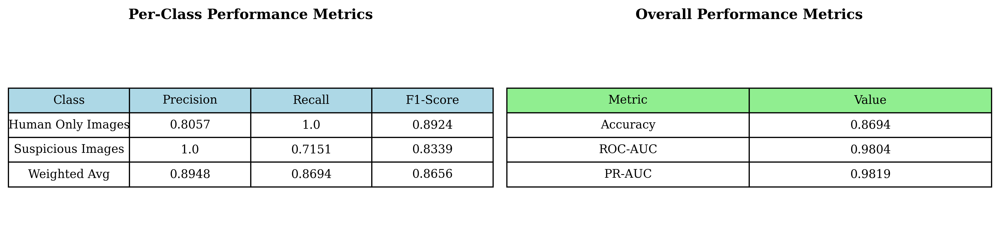

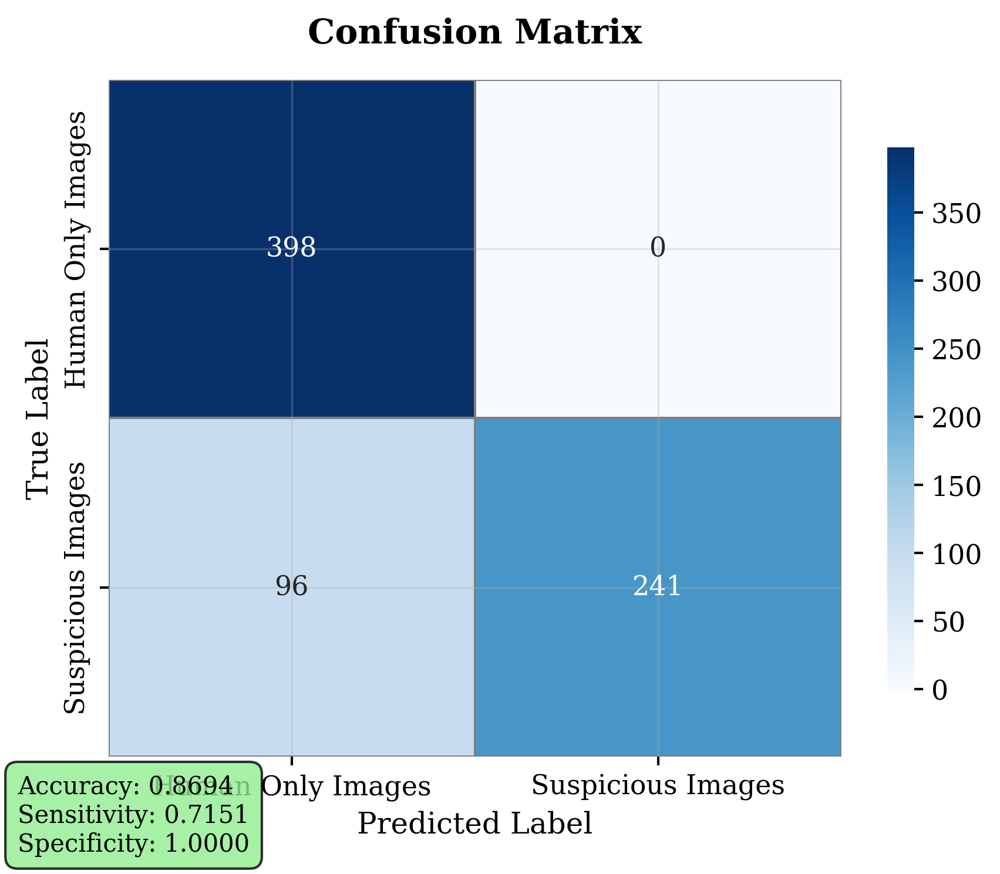

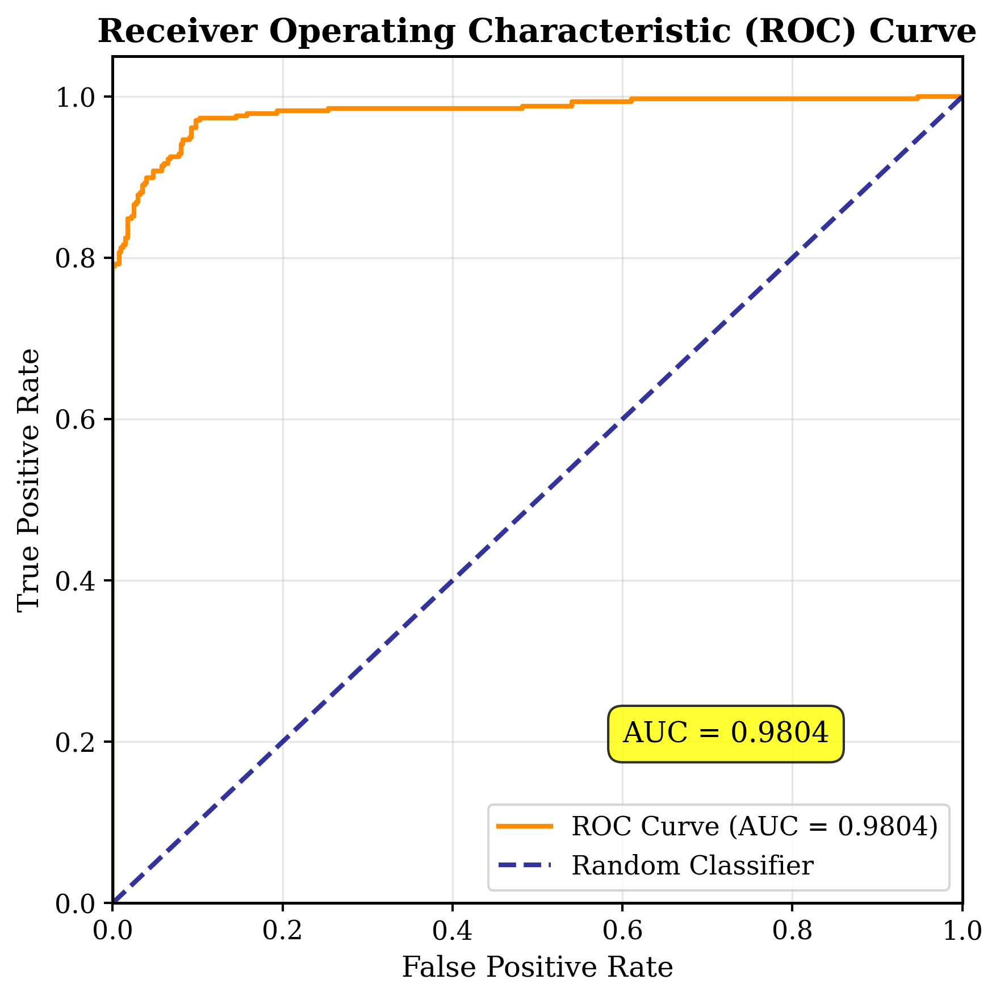

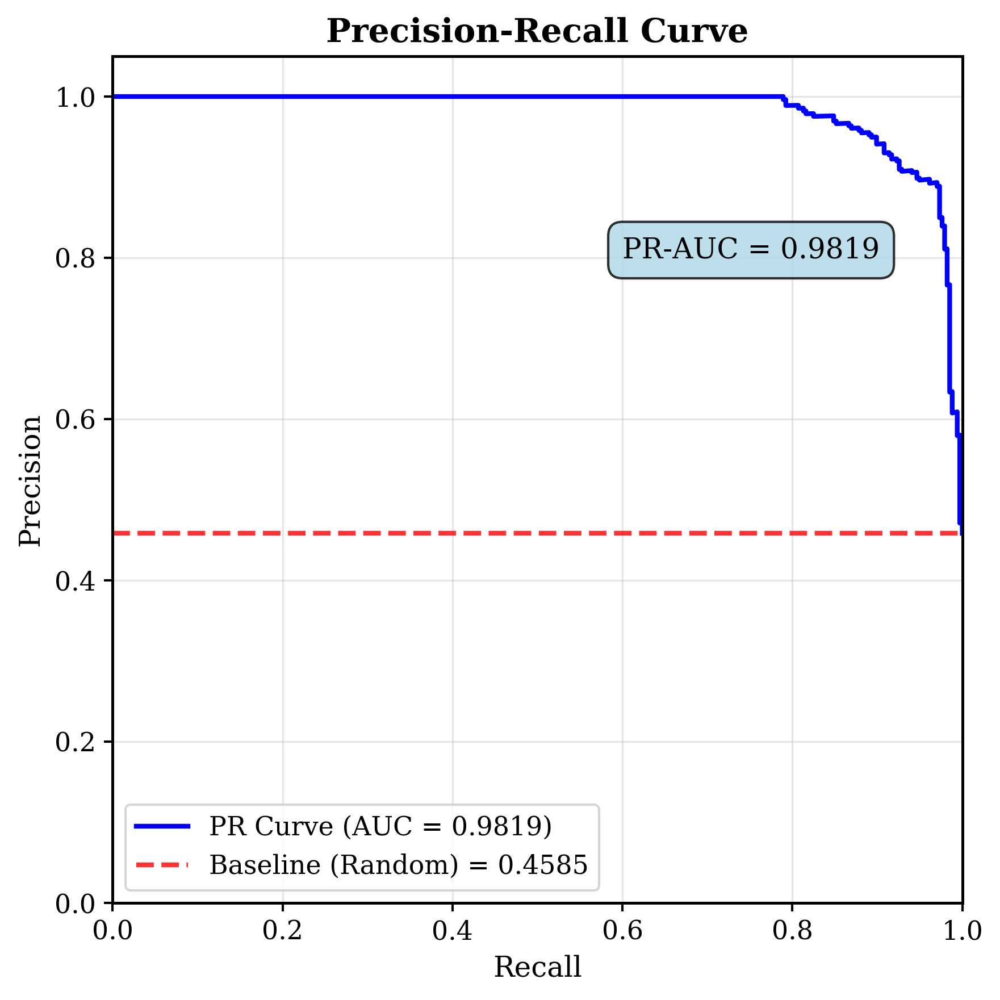

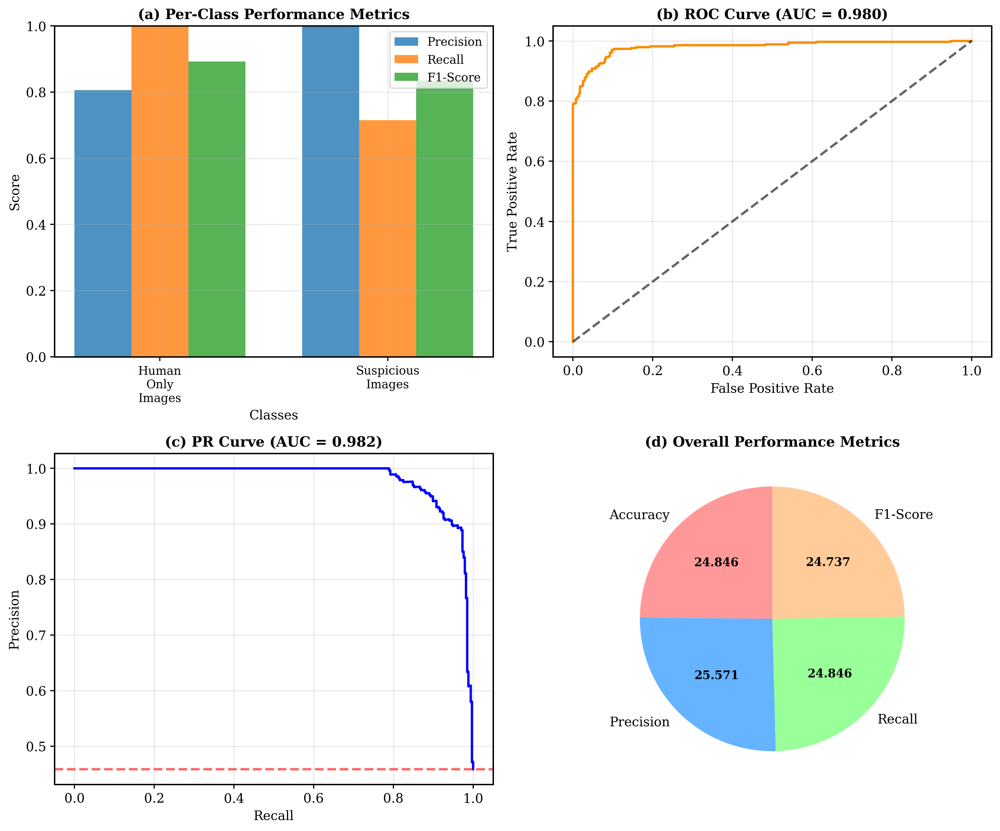



=== SUMMARY STATISTICS ===
Total Test Samples: 735
Accuracy: 0.8694, ROC-AUC: 0.9804, PR-AUC: 0.9819
Weighted Precision: 0.8948, Weighted Recall: 0.8694, Weighted F1-Score: 0.8656

--- Per-class Performance ---
Human Only Images -> Precision: 0.8057, Recall: 1.0000, F1-Score: 0.8924
Suspicious Images -> Precision: 1.0000, Recall: 0.7151, F1-Score: 0.8339


=== LATEX TABLE CODE FOR CONFERENCE PAPER 📄 ===
% Per-Class Results Table
\begin{table}[htbp]
\centering
\caption{Experimental Results for Suspicious Activity Detection}\label{tab:results}
\begin{tabular}{|c|c|c|c|}
\hline
\textbf{Class} & \textbf{Precision} & \textbf{Recall} & \textbf{F1-Score} \\
\hline
Human Only Images & 0.806 & 1.000 & 0.892 \\
Suspicious Images & 1.000 & 0.715 & 0.834 \\
Weighted Avg & 0.895 & 0.869 & 0.866 \\
\hline
\end{tabular}
\end{table}

% Overall Metrics Table
\begin{table}[htbp]
\centering
\caption{Overall Performance Metrics}\label{tab:overall}
\begin{tabular}{|c|c|}
\hline
\textbf{Metric} & \textbf{

In [16]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (classification_report, confusion_matrix, roc_curve, auc, 
                             precision_recall_curve, accuracy_score, precision_score, 
                             recall_score, f1_score)
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# --- 1. Configuration ---
plt.rcParams.update({
    'font.size': 11, 'font.family': 'serif', 'axes.linewidth': 1.2,
    'grid.linewidth': 0.8, 'lines.linewidth': 2.0, 'patch.linewidth': 1.0,
    'xtick.major.width': 1.0, 'ytick.major.width': 1.0, 'figure.dpi': 300,
    'savefig.dpi': 300, 'savefig.bbox': 'tight', 'savefig.pad_inches': 0.1,
    'axes.grid': True, 'grid.alpha': 0.3
})

# Define paths and parameters
test_dir = '/kaggle/working/sorted_data/test'
model_path = '/kaggle/working/suspicion_detection_model.h5'
IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE = 128, 128, 32

# --- 2. Load Model and Data ---
print("Loading trained model and test data...")
model = load_model(model_path)
test_data_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    directory=test_dir, target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE, class_mode='binary', shuffle=False
)

# Get class info
class_labels = list(test_data_gen.class_indices.keys())
class_names = [label.replace('_', ' ').title() for label in class_labels]
print(f"Class Indices: {test_data_gen.class_indices}")

# --- 3. Get Predictions ---
print("Making predictions on the test set...")
true_classes = test_data_gen.classes
steps_for_prediction = int(np.ceil(test_data_gen.samples / BATCH_SIZE))
predictions_prob = model.predict(test_data_gen, steps=steps_for_prediction, verbose=0).flatten()
predictions_binary = (predictions_prob > 0.5).astype(int)

# --- 4. Metrics Calculation & Visualization Functions ---
def calculate_all_metrics(y_true, y_pred, y_prob):
    """Calculate all evaluation metrics."""
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_prob)
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, average='weighted'),
        'recall': recall_score(y_true, y_pred, average='weighted'),
        'f1': f1_score(y_true, y_pred, average='weighted'),
        'precision_per_class': precision_score(y_true, y_pred, average=None),
        'recall_per_class': recall_score(y_true, y_pred, average=None),
        'f1_per_class': f1_score(y_true, y_pred, average=None),
        'fpr': fpr, 'tpr': tpr, 'roc_auc': auc(fpr, tpr),
        'precision_curve': precision_curve, 'recall_curve': recall_curve,
        'pr_auc': auc(recall_curve, precision_curve)
    }

def create_results_table(metrics, class_names, save_path=None):
    """Create a comprehensive results table."""
    table_data = {'Class': class_names + ['Weighted Avg'],
                  'Precision': list(metrics['precision_per_class']) + [metrics['precision']],
                  'Recall': list(metrics['recall_per_class']) + [metrics['recall']],
                  'F1-Score': list(metrics['f1_per_class']) + [metrics['f1']]}
    overall_metrics = {'Accuracy': f"{metrics['accuracy']:.4f}",
                       'ROC-AUC': f"{metrics['roc_auc']:.4f}",
                       'PR-AUC': f"{metrics['pr_auc']:.4f}"}
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    
    # Per-class metrics table
    df = pd.DataFrame(table_data).round(4)
    ax1.axis('tight'); ax1.axis('off')
    table1 = ax1.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center', colColours=['lightblue']*4)
    table1.auto_set_font_size(False); table1.set_fontsize(10); table1.scale(1, 1.8)
    ax1.set_title('Per-Class Performance Metrics', fontsize=12, pad=20, weight='bold')

    # Overall metrics table
    overall_df = pd.DataFrame(list(overall_metrics.items()), columns=['Metric', 'Value'])
    ax2.axis('tight'); ax2.axis('off')
    table2 = ax2.table(cellText=overall_df.values, colLabels=overall_df.columns, cellLoc='center', loc='center', colColours=['lightgreen']*2)
    table2.auto_set_font_size(False); table2.set_fontsize(10); table2.scale(1, 1.8)
    ax2.set_title('Overall Performance Metrics', fontsize=12, pad=20, weight='bold')

    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()
    return df, overall_df

def create_publication_confusion_matrix(y_true, y_pred, class_names, save_path=None):
    """Create publication-ready confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.8}, ax=ax, linewidths=0.5, linecolor='gray')
    ax.set_title('Confusion Matrix', fontsize=14, pad=15, weight='bold')
    ax.set_ylabel('True Label', fontsize=12)
    ax.set_xlabel('Predicted Label', fontsize=12)
    accuracy = accuracy_score(y_true, y_pred)
    if cm.shape == (2, 2):
        tn, fp, fn, tp = cm.ravel()
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        metrics_text = f'Accuracy: {accuracy:.4f}\nSensitivity: {sensitivity:.4f}\nSpecificity: {specificity:.4f}'
    else:
        metrics_text = f'Accuracy: {accuracy:.4f}'
    fig.text(0.02, 0.02, metrics_text, fontsize=10, bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.8))
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def create_roc_curve(metrics, save_path=None):
    """Create publication-ready ROC curve."""
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.plot(metrics['fpr'], metrics['tpr'], color='darkorange', lw=2, label=f'ROC Curve (AUC = {metrics["roc_auc"]:.4f})')
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.8, label='Random Classifier')
    ax.set_xlim([0.0, 1.0]); ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate', fontsize=12)
    ax.set_ylabel('True Positive Rate', fontsize=12)
    ax.set_title('Receiver Operating Characteristic (ROC) Curve', fontsize=14, weight='bold')
    ax.legend(loc="lower right", fontsize=11)
    ax.grid(True, alpha=0.3)
    ax.text(0.6, 0.2, f'AUC = {metrics["roc_auc"]:.4f}', fontsize=12, bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.8))
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def create_precision_recall_curve(metrics, y_true, save_path=None):
    """Create publication-ready Precision-Recall curve."""
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.plot(metrics['recall_curve'], metrics['precision_curve'], color='blue', lw=2, label=f'PR Curve (AUC = {metrics["pr_auc"]:.4f})')
    baseline = np.sum(y_true) / len(y_true)
    ax.axhline(y=baseline, color='red', linestyle='--', lw=2, alpha=0.8, label=f'Baseline (Random) = {baseline:.4f}')
    ax.set_xlim([0.0, 1.0]); ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('Recall', fontsize=12)
    ax.set_ylabel('Precision', fontsize=12)
    ax.set_title('Precision-Recall Curve', fontsize=14, weight='bold')
    ax.legend(loc="lower left", fontsize=11)
    ax.grid(True, alpha=0.3)
    ax.text(0.6, 0.8, f'PR-AUC = {metrics["pr_auc"]:.4f}', fontsize=12, bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def create_combined_metrics_plot(metrics, class_names, y_true, save_path=None):
    """Create a combined visualization of multiple metrics."""
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))
    # Per-class metrics bar plot
    x = np.arange(len(class_names)); width = 0.25
    ax1.bar(x - width, metrics['precision_per_class'], width, label='Precision', alpha=0.8)
    ax1.bar(x, metrics['recall_per_class'], width, label='Recall', alpha=0.8)
    ax1.bar(x + width, metrics['f1_per_class'], width, label='F1-Score', alpha=0.8)
    ax1.set_xlabel('Classes', fontsize=11); ax1.set_ylabel('Score', fontsize=11)
    ax1.set_title('(a) Per-Class Performance Metrics', fontsize=12, weight='bold')
    ax1.set_xticks(x); ax1.set_xticklabels([name.replace(' ', '\n') for name in class_names], fontsize=10)
    ax1.legend(fontsize=10); ax1.grid(True, alpha=0.3); ax1.set_ylim([0, 1])
    # ROC Curve
    ax2.plot(metrics['fpr'], metrics['tpr'], color='darkorange', lw=2)
    ax2.plot([0, 1], [0, 1], 'k--', alpha=0.6)
    ax2.set_xlabel('False Positive Rate', fontsize=11); ax2.set_ylabel('True Positive Rate', fontsize=11)
    ax2.set_title(f'(b) ROC Curve (AUC = {metrics["roc_auc"]:.3f})', fontsize=12, weight='bold')
    ax2.grid(True, alpha=0.3)
    # Precision-Recall Curve
    ax3.plot(metrics['recall_curve'], metrics['precision_curve'], color='blue', lw=2)
    baseline = np.sum(y_true) / len(y_true)
    ax3.axhline(y=baseline, color='red', linestyle='--', alpha=0.6)
    ax3.set_xlabel('Recall', fontsize=11); ax3.set_ylabel('Precision', fontsize=11)
    ax3.set_title(f'(c) PR Curve (AUC = {metrics["pr_auc"]:.3f})', fontsize=12, weight='bold')
    ax3.grid(True, alpha=0.3)
    # Overall metrics pie chart
    overall_scores = [metrics['accuracy'], metrics['precision'], metrics['recall'], metrics['f1']]
    labels = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
    wedges, texts, autotexts = ax4.pie(overall_scores, labels=labels, autopct='%1.3f', colors=colors, startangle=90)
    ax4.set_title('(d) Overall Performance Metrics', fontsize=12, weight='bold')
    for autotext in autotexts: autotext.set_color('black'); autotext.set_fontsize(10); autotext.set_weight('bold')
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(df_results, df_overall):
    """Generate LaTeX code for the results tables."""
    print("\n\n=== LATEX TABLE CODE FOR CONFERENCE PAPER 📄 ===")
    print("% Per-Class Results Table")
    print("\\begin{table}[htbp]\n\\centering\n\\caption{Experimental Results for Suspicious Activity Detection}\\label{tab:results}")
    print("\\begin{tabular}{|c|c|c|c|}\n\\hline")
    print("\\textbf{Class} & \\textbf{Precision} & \\textbf{Recall} & \\textbf{F1-Score} \\\\\n\\hline")
    for _, row in df_results.iterrows(): print(f"{row['Class']} & {row['Precision']:.3f} & {row['Recall']:.3f} & {row['F1-Score']:.3f} \\\\")
    print("\\hline\n\\end{tabular}\n\\end{table}")
    print("\n% Overall Metrics Table")
    print("\\begin{table}[htbp]\n\\centering\n\\caption{Overall Performance Metrics}\\label{tab:overall}")
    print("\\begin{tabular}{|c|c|}\n\\hline")
    print("\\textbf{Metric} & \\textbf{Value} \\\\\n\\hline")
    for _, row in df_overall.iterrows(): print(f"{row['Metric']} & {row['Value']} \\\\")
    print("\\hline\n\\end{tabular}\n\\end{table}")

# --- 5. Main Execution Block ---
print("\n\n=== GENERATING PUBLICATION-READY EXPERIMENTAL RESULTS ===")
metrics = calculate_all_metrics(true_classes, predictions_binary, predictions_prob)
df_results, df_overall = create_results_table(metrics, class_names, 'results_table.png')
create_publication_confusion_matrix(true_classes, predictions_binary, class_names, 'confusion_matrix.png')
create_roc_curve(metrics, 'roc_curve.png')
create_precision_recall_curve(metrics, true_classes, 'precision_recall_curve.png')
create_combined_metrics_plot(metrics, class_names, true_classes, 'combined_metrics.png')

print("\n\n=== SUMMARY STATISTICS ===")
print(f"Total Test Samples: {len(true_classes)}")
print(f"Accuracy: {metrics['accuracy']:.4f}, ROC-AUC: {metrics['roc_auc']:.4f}, PR-AUC: {metrics['pr_auc']:.4f}")
print(f"Weighted Precision: {metrics['precision']:.4f}, Weighted Recall: {metrics['recall']:.4f}, Weighted F1-Score: {metrics['f1']:.4f}")
print("\n--- Per-class Performance ---")
for i, class_name in enumerate(class_names):
    print(f"{class_name} -> Precision: {metrics['precision_per_class'][i]:.4f}, Recall: {metrics['recall_per_class'][i]:.4f}, F1-Score: {metrics['f1_per_class'][i]:.4f}")

generate_latex_table(df_results, df_overall)

print("\n\n✅ All figures and tables generated successfully at 300 DPI!")

In [17]:
def predict_and_visualize_paper_format(image_path, model, img_height=128, img_width=128, 
                                      class_labels=None, save_path=None, show_title=True):
    # --- Load & preprocess ---
    original_img = load_img(image_path, target_size=(img_height, img_width))
    original_img_array = img_to_array(original_img)
    preprocessed_img_array = original_img_array / 255.0
    img_tensor = np.expand_dims(preprocessed_img_array, axis=0)

    # Predict
    prediction = model.predict(img_tensor, verbose=0)
    predicted_class_idx = (prediction > 0.5).astype(int)[0][0]
    predicted_class = class_labels[predicted_class_idx]
    confidence = prediction[0][0] if predicted_class_idx == 1 else 1 - prediction[0][0]

    # Grad-CAM
    last_conv_layer = None
    for layer in model.layers[::-1]:
        if 'conv' in layer.name.lower():
            last_conv_layer = layer
            break
    
    heatmap_resized, heatmap_colored = None, None
    if last_conv_layer is not None:
        grad_model = tf.keras.models.Model(
            inputs=[model.inputs],
            outputs=[last_conv_layer.output, model.output]
        )
        with tf.GradientTape() as tape:
            conv_outputs, preds = grad_model(img_tensor)
            class_output = preds[:, 0] if predicted_class_idx == 1 else 1 - preds[:, 0]
        grads = tape.gradient(class_output, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0)
        heatmap /= (tf.reduce_max(heatmap) + 1e-10)
        heatmap_resized = cv2.resize(heatmap.numpy(), (img_width, img_height))
        heatmap_colored = cv2.cvtColor(
            cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET),
            cv2.COLOR_BGR2RGB
        )

    # --- Top-to-bottom arrangement ---
    fig, axes = plt.subplots(3, 1, figsize=(4, 9))  # 3 rows, 1 column
    plt.subplots_adjust(hspace=0.05)

    # (a) Input Image
    axes[0].imshow(original_img_array.astype(np.uint8))
    axes[0].set_title('(a) Input Image', fontsize=10, pad=5)
    axes[0].axis('off')

    # (b) Grad-CAM
    if heatmap_resized is not None:
        im1 = axes[1].imshow(heatmap_resized, cmap='jet')
        axes[1].set_title('(b) Grad-CAM', fontsize=10, pad=5)
        axes[1].axis('off')
        cbar1 = plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, shrink=0.8)
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_label('Activation', fontsize=8)
    else:
        axes[1].text(0.5, 0.5, 'No Heatmap\nAvailable', ha='center', va='center',
                    fontsize=9, transform=axes[1].transAxes)
        axes[1].set_title('(b) Grad-CAM', fontsize=10, pad=5)
        axes[1].axis('off')

    # (c) Overlay
    if heatmap_colored is not None:
        overlay = cv2.addWeighted(original_img_array.astype(np.uint8), 0.6, heatmap_colored, 0.4, 0)
        axes[2].imshow(overlay)
        axes[2].set_title('(c) Overlay', fontsize=10, pad=5)
    else:
        axes[2].imshow(original_img_array.astype(np.uint8))
        axes[2].set_title('(c) Input Image', fontsize=10, pad=5)
    axes[2].axis('off')

    # Prediction text box
    pred_text = f"Prediction: {predicted_class.replace('_', ' ').title()}\nConfidence: {confidence:.3f}"
    fig.text(0.02, 0.01, pred_text, fontsize=9, verticalalignment='bottom',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgray', alpha=0.8))

    if show_title:
        fig.suptitle("Suspicion Detection Analysis", fontsize=11, y=0.995)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

    return predicted_class, confidence
